In [1]:
## README: this script for written for torque cluster. You 
##         need to submit the qsub command within the 
##         orl_major_project folder. Otherwise, if you want to
##         reproduce, make sure to change {ORL}

#------ ENVIRONMENT PREPARATION

# for the torque cluster I need to tell where my library is...
libloc <- Sys.getenv("R_LIBS")
# dont use R_LIBS on local machine
if (libloc != "") {
  pkgs <- list("tidyverse", "here", "future", "furrr", "glue", "brms")
  lapply(pkgs, function(pkg) {
    library(pkg, character.only = TRUE, lib.loc = libloc)
  })
  } else {
  pkgs <- list("tidyverse", "here", "furrr", "glue", "brms")
  lapply(pkgs, function(pkg) {
    library(pkg, character.only = TRUE)
  })
}


# learn time 
start = Sys.time()
print(start)

BIBO <- Sys.getenv("BIBO")
# check if save works 
check = tibble(test = 1, notest = 2)
save(check, file = glue("{BIBO}/rdata/hubeldihub.rds"))
print("save worked!!")
#------ ACTUAL CODING

# load prepared data
load(glue("{BIBO}/rdata/test_data2.rds"))
# load own functions
source("https://raw.githubusercontent.com/HenrikEckermann/in_use/master/mb_helper.R")
source("https://raw.githubusercontent.com/HenrikEckermann/in_use/master/reporting.R")


test_t <- brm(
    family = student(),
    formula = bf(
        abundance ~ 1 + cc*time + age_d_s + bf_count_s + sibling*csection + 
            (1 + cc*time + age_d_s + bf_count_s + sibling*csection|genus), 
        sigma ~ 1 + genus),
    data = test_data,
    control = list(adapt_delta = 0.95, max_treedepth = 15),
    file = glue("{BIBO}/rdata/testmodel"), 
    cores = future::availableCores()
)



── Attaching packages ─────────────────────────────────────── tidyverse 1.2.1 ──
✔ ggplot2 3.1.0       ✔ purrr   0.3.0  
✔ tibble  2.0.1       ✔ dplyr   0.8.0.1
✔ tidyr   0.8.2       ✔ stringr 1.4.0  
✔ readr   1.3.1       ✔ forcats 0.3.0  
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
here() starts at /Users/henrikeckermann/workspace/research_master/minor_research_project/article/analyses/bibo
Loading required package: future

Attaching package: ‘glue’

The following object is masked from ‘package:dplyr’:

    collapse

Loading required package: Rcpp
Loading 'brms' package (version 2.7.1). Useful instructions
can be found by typing help('brms'). A more detailed introduction
to the package is available through vignette('brms_overview').
Run theme_set(theme_default()) to use the default bayesplot theme.


[[1]]
 [1] "forcats"   "stringr"   "dplyr"     "purrr"     "readr"     "tidyr"    
 [7] "tibble"    "ggplot2"   "tidyverse" "stats"     "graphics"  "grDevices"
[13] "utils"     "datasets"  "methods"   "base"     

[[2]]
 [1] "here"      "forcats"   "stringr"   "dplyr"     "purrr"     "readr"    
 [7] "tidyr"     "tibble"    "ggplot2"   "tidyverse" "stats"     "graphics" 
[13] "grDevices" "utils"     "datasets"  "methods"   "base"     

[[3]]
 [1] "furrr"     "future"    "here"      "forcats"   "stringr"   "dplyr"    
 [7] "purrr"     "readr"     "tidyr"     "tibble"    "ggplot2"   "tidyverse"
[13] "stats"     "graphics"  "grDevices" "utils"     "datasets"  "methods"  
[19] "base"     

[[4]]
 [1] "glue"      "furrr"     "future"    "here"      "forcats"   "stringr"  
 [7] "dplyr"     "purrr"     "readr"     "tidyr"     "tibble"    "ggplot2"  
[13] "tidyverse" "stats"     "graphics"  "grDevices" "utils"     "datasets" 
[19] "methods"   "base"     

[[5]]
 [1] "brms"      "Rcpp"      "glue"      "furrr"     "future"    "here"     
 [7] "forcats"   "stringr"   "dplyr"     "purrr"     "readr"     "tidyr"    
[13] "tibble"    "ggplot2"   "tidyverse" "stats"     "graphics"  "grDevices"
[19] "utils"     "datasets"  "methods"   "base"

[1] "2019-02-24 06:43:52 CET"
[1] "save worked!!"



Attaching package: ‘phyloseq’

The following object is masked from ‘package:brms’:

    nsamples



In [22]:
library(tidybayes)
posterior_samples(test_t) %>%
    mutate_at(vars(contains("sigma")), exp) %>%
    gather(parameter, value) %>%
    group_by(parameter) %>%
    mean_hdi() %>%
    mutate_if(is.numeric, round, 2) %>%
    #filter(grepl("ccyes", parameter) & grepl("genus", parameter) & !grepl("cor", parameter)) %>%
    filter(grepl("Enterococcus", parameter)) %>%
    arrange(desc(value))

parameter,value,.lower,.upper,.width,.point,.interval
b_sigma_genusEnterococcus,12.32,9.43,15.32,0.95,mean,hdi
"r_genus[Enterococcus,Intercept]",0.86,0.52,1.20,0.95,mean,hdi
"r_genus[Enterococcus,csection1]",0.02,-0.05,0.09,0.95,mean,hdi
"r_genus[Enterococcus,age_d_s]",0.00,-0.01,0.02,0.95,mean,hdi
"r_genus[Enterococcus,bf_count_s]",0.00,-0.02,0.01,0.95,mean,hdi
"r_genus[Enterococcus,ccyes:timepost]",0.00,-0.02,0.01,0.95,mean,hdi
"r_genus[Enterococcus,ccyes]",0.00,-0.01,-0.01,0.95,mean,hdi
"r_genus[Enterococcus,ccyes]",0.00,-0.01,0.01,0.95,mean,hdi
"r_genus[Enterococcus,sibling1:csection1]",0.00,-0.04,0.03,0.95,mean,hdi
"r_genus[Enterococcus,sibling1]",0.00,-0.01,-0.01,0.95,mean,hdi


In [30]:
test_data$genus %>% unique() %>% length()

[1] 73

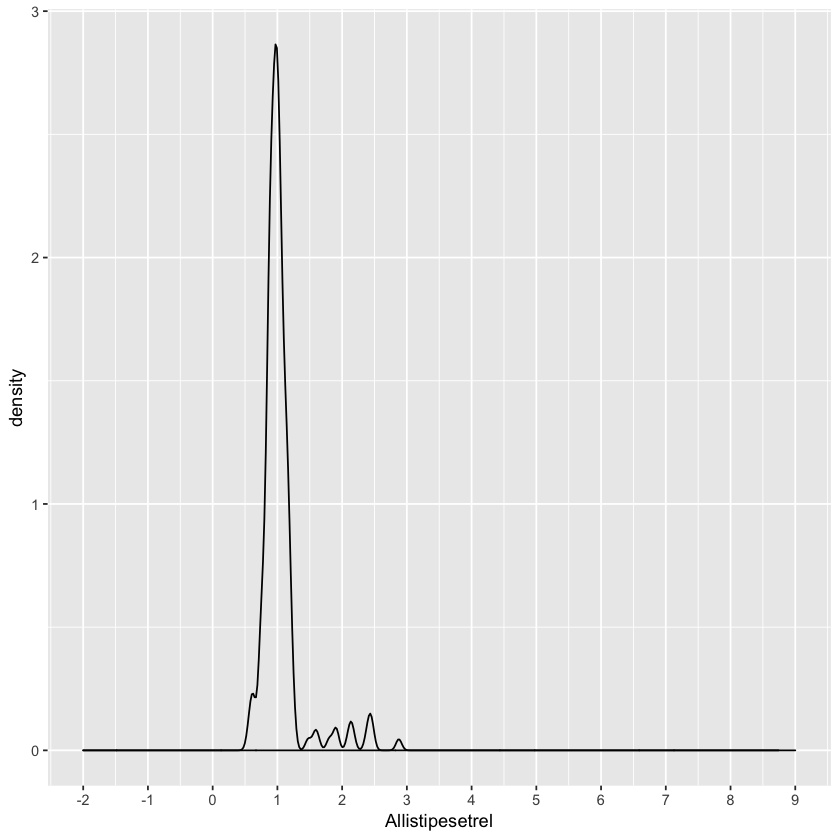

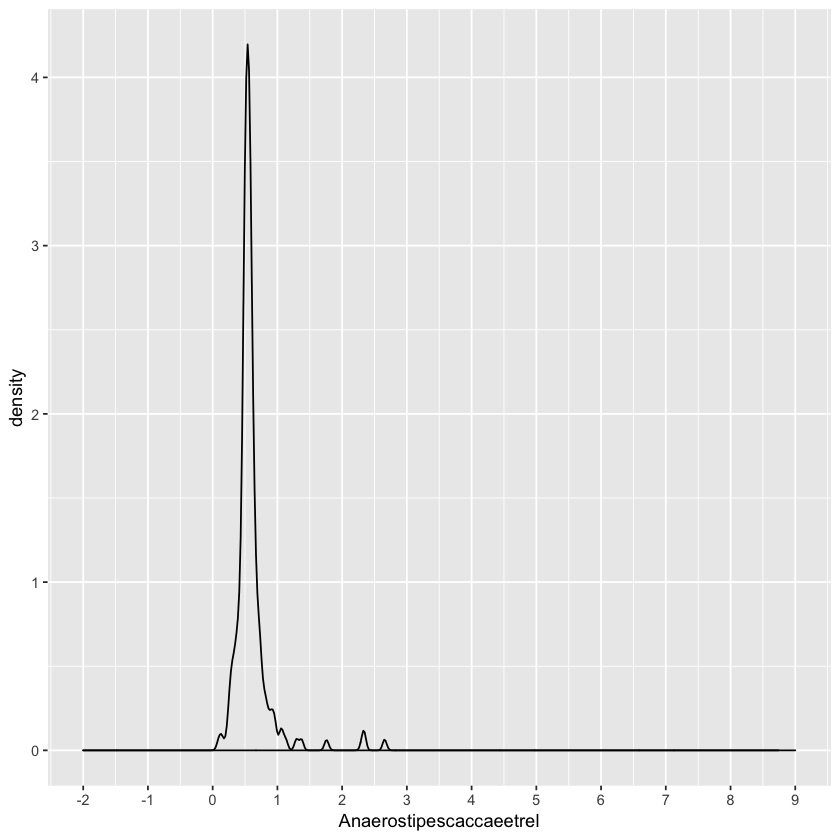

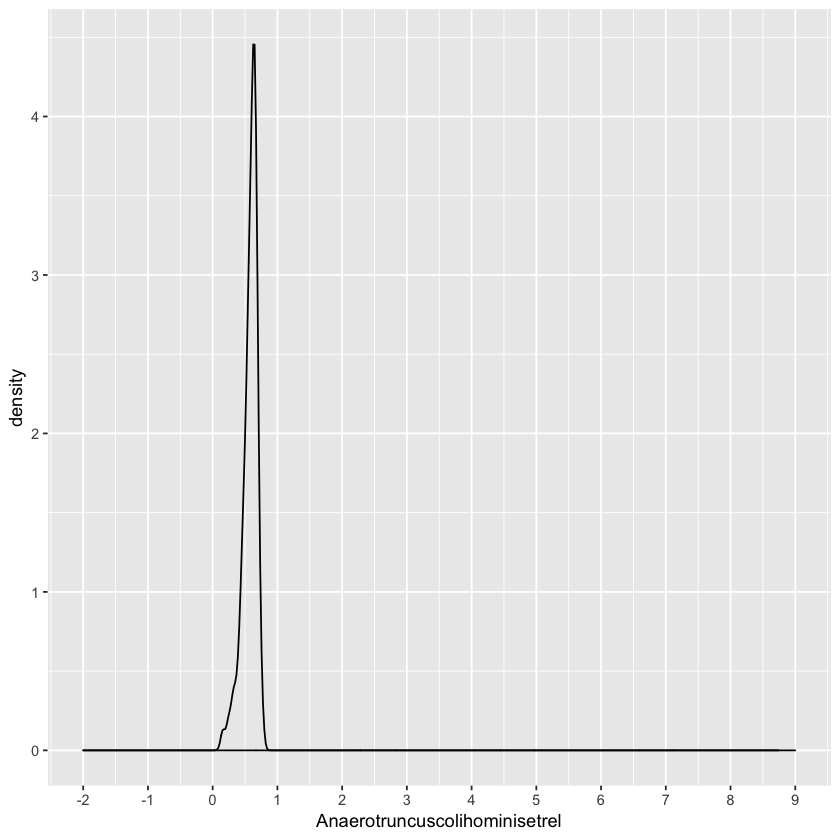

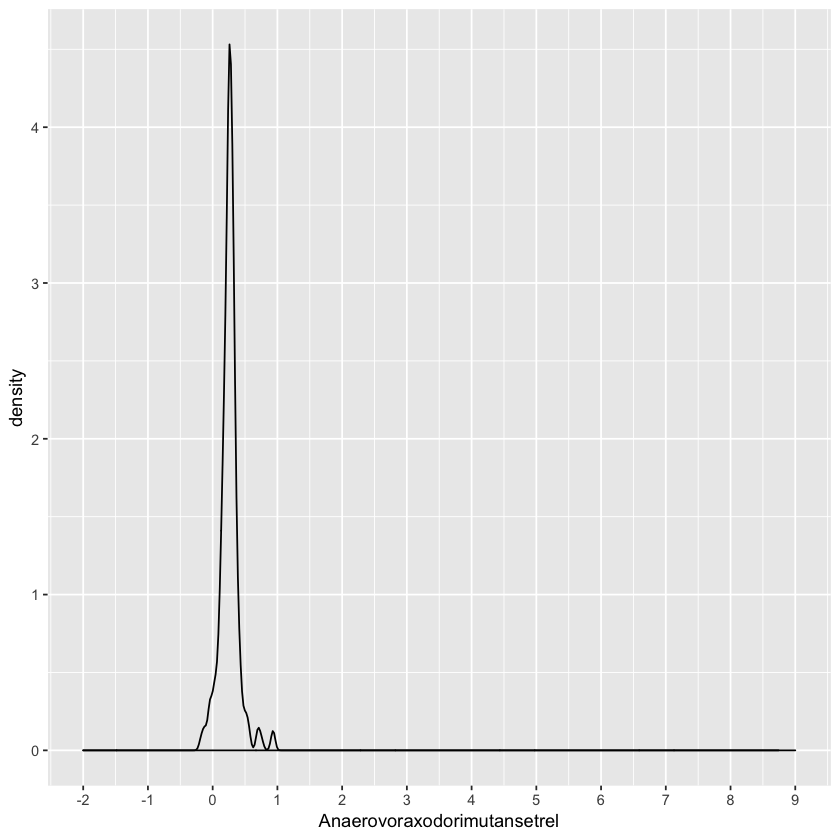

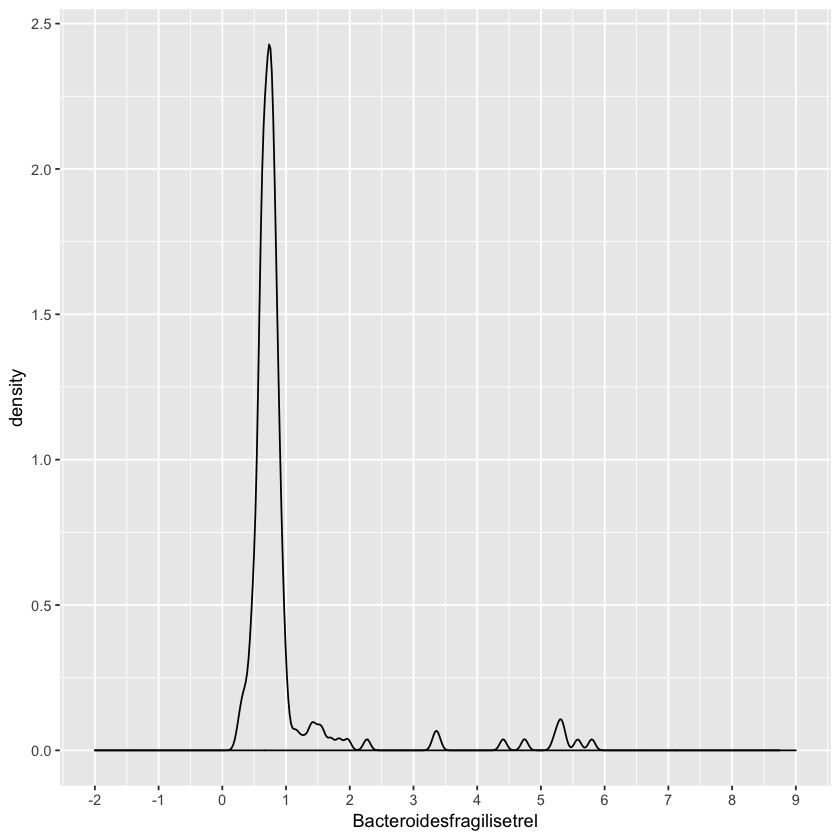

...

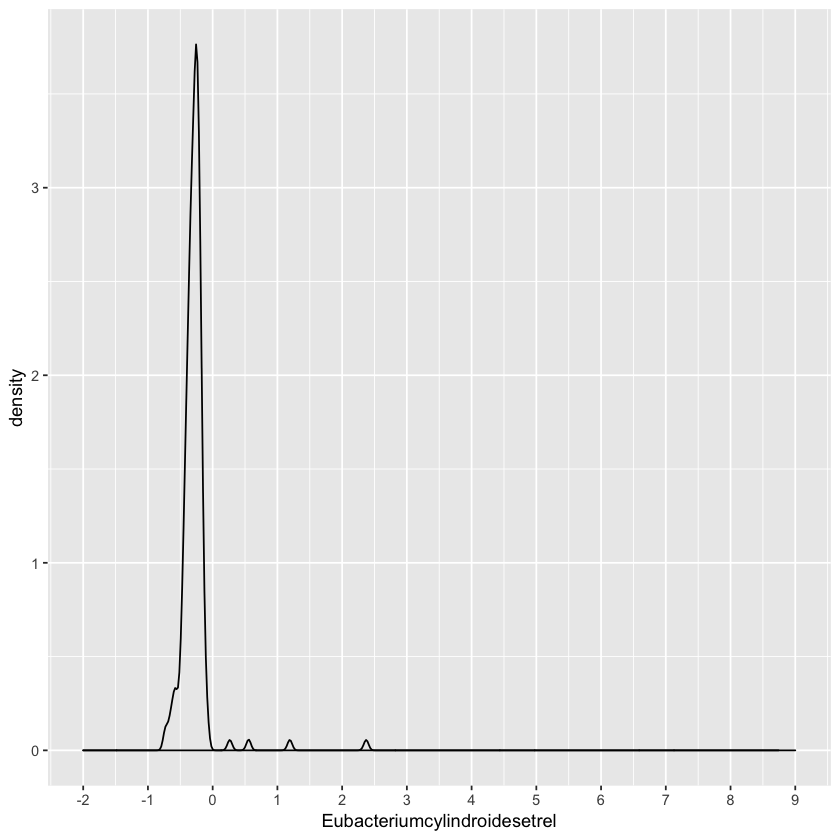

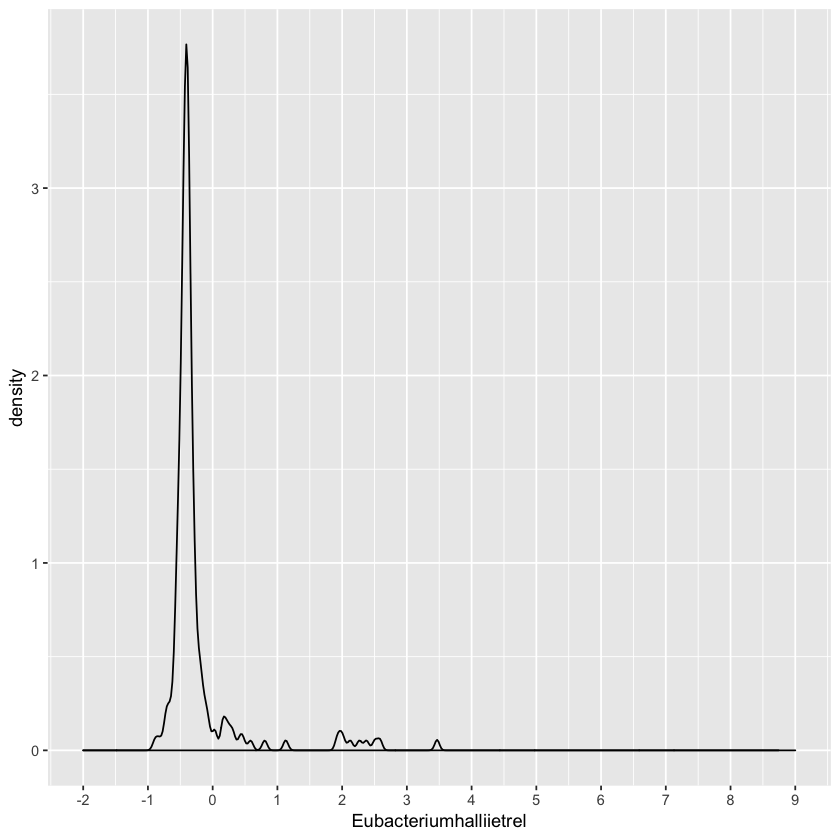

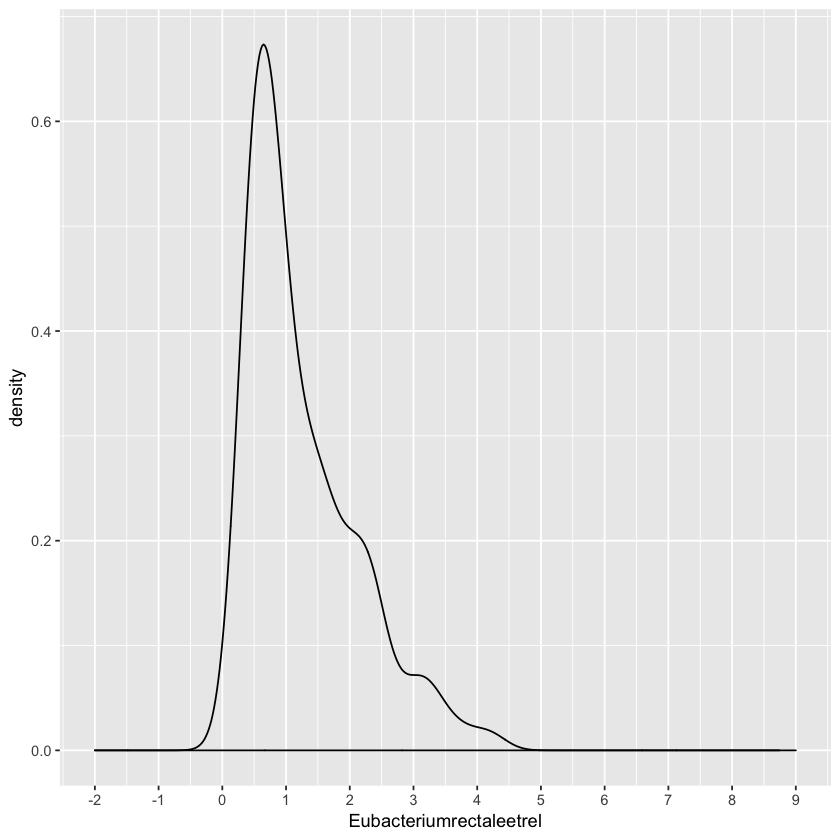

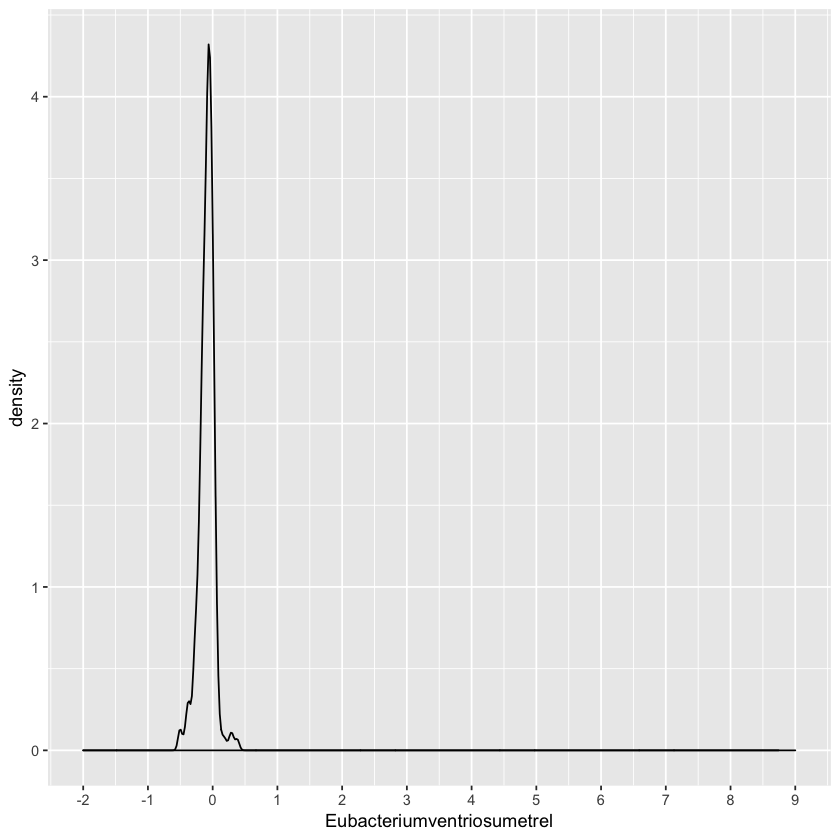

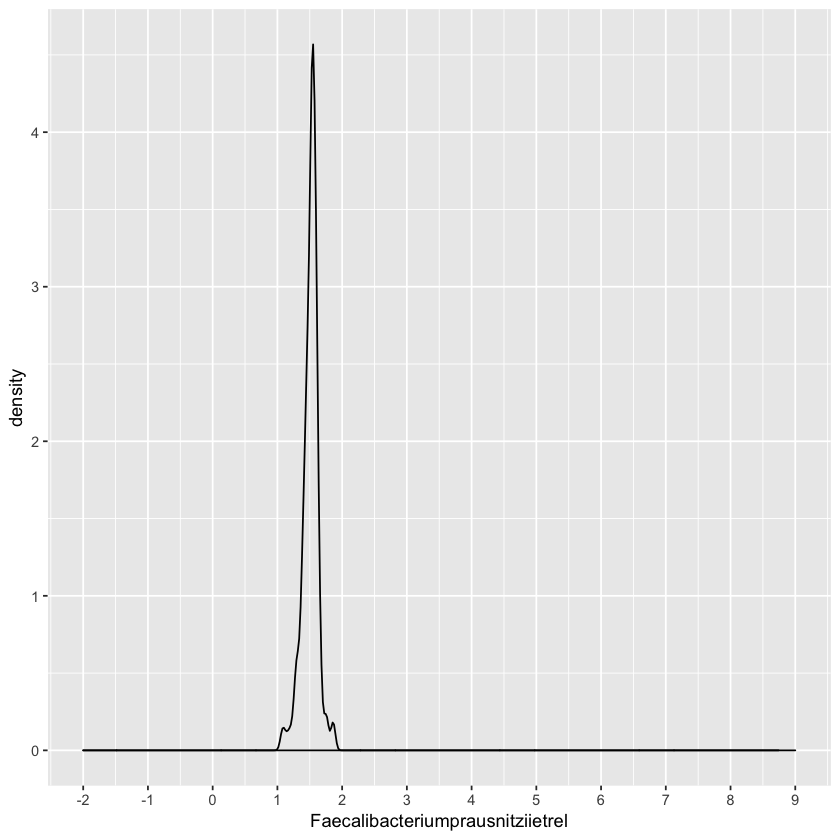

Warning message:
“Removed 1 rows containing non-finite values (stat_density).”

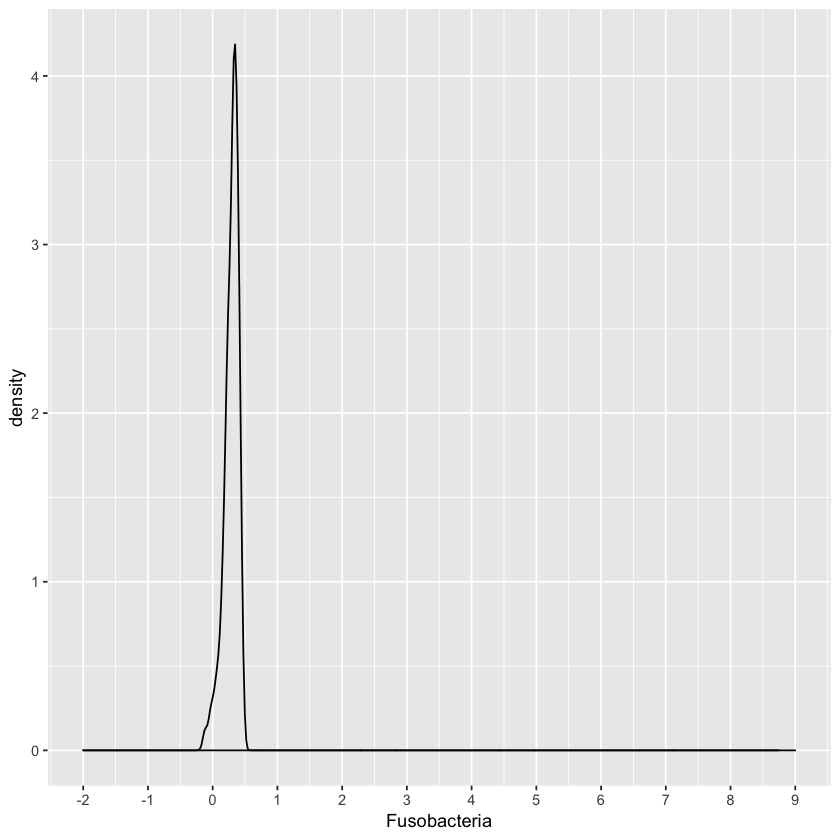

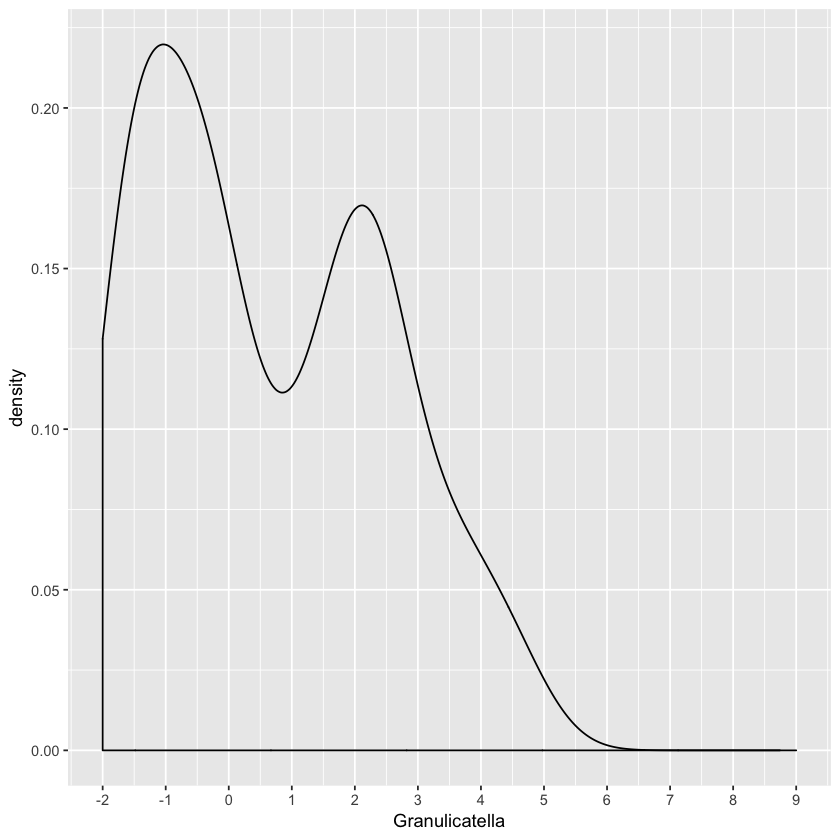

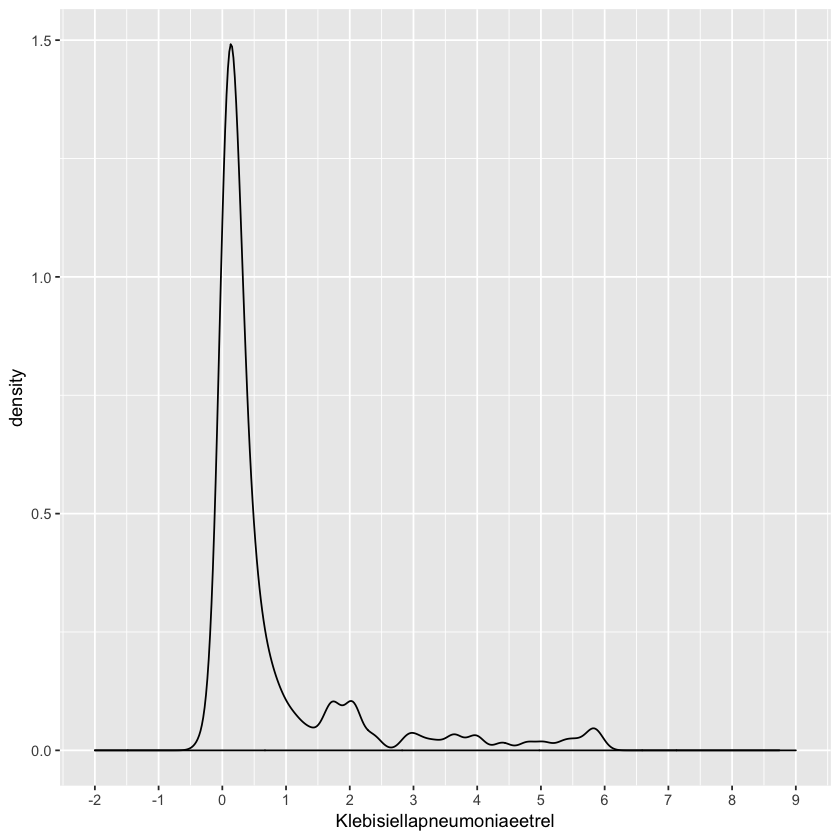

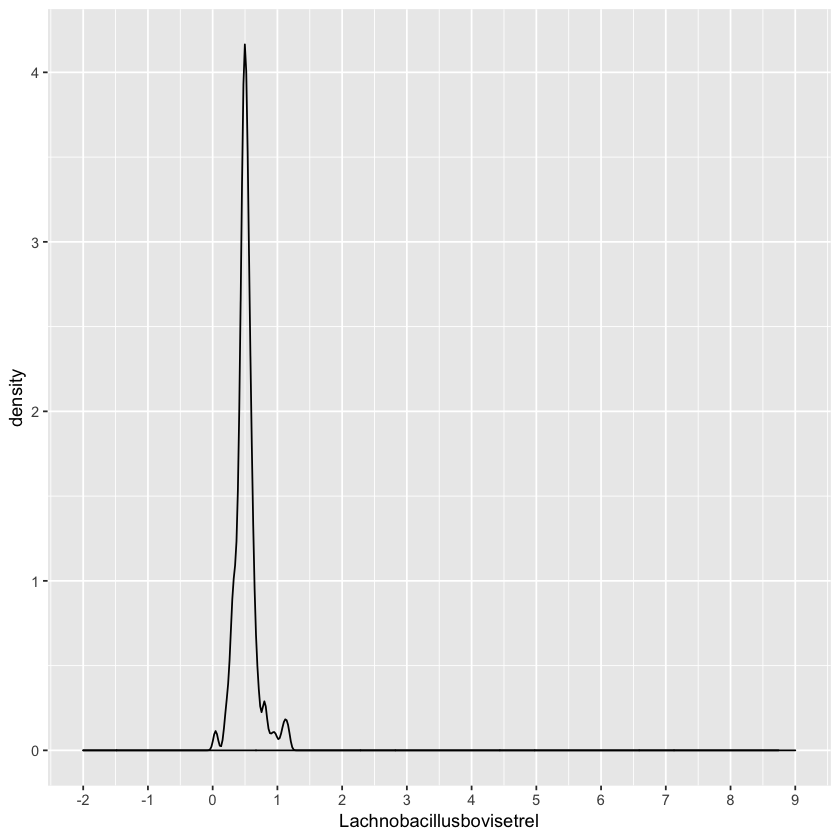

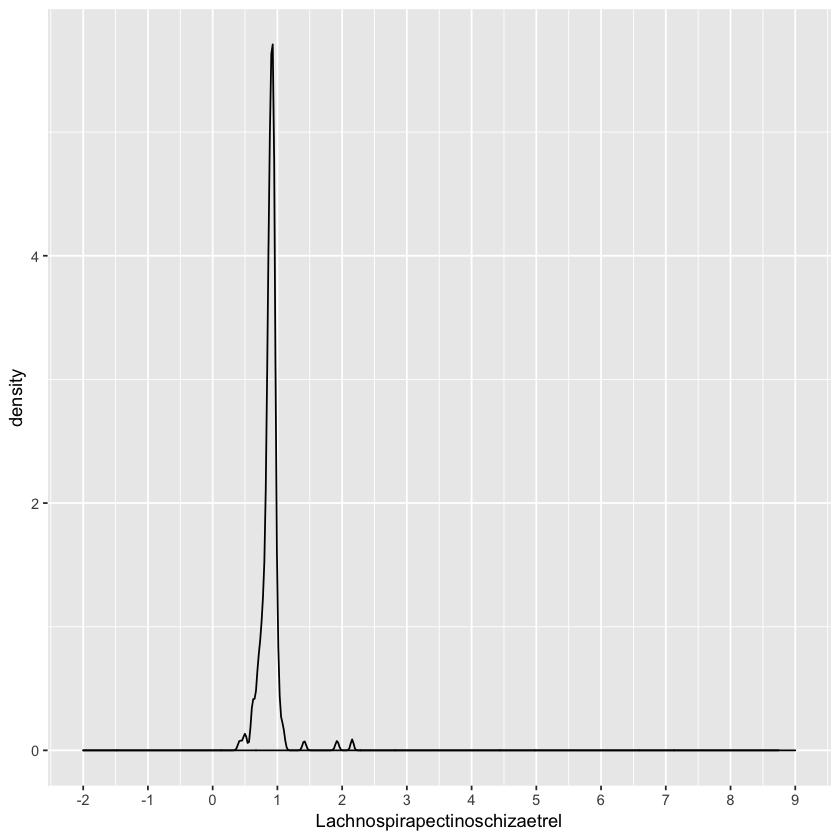

...

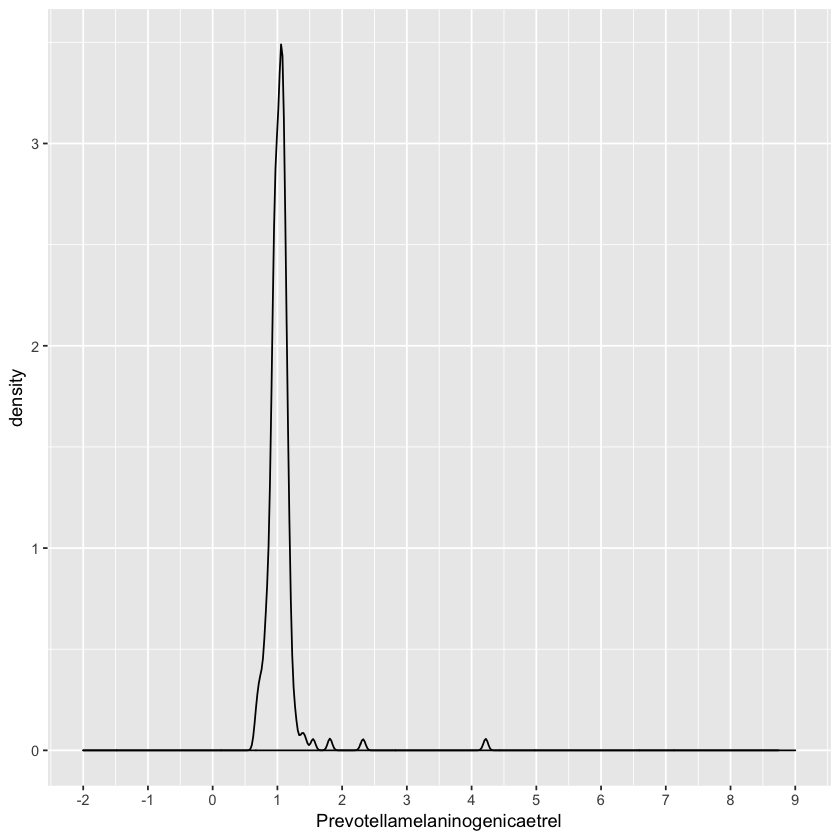

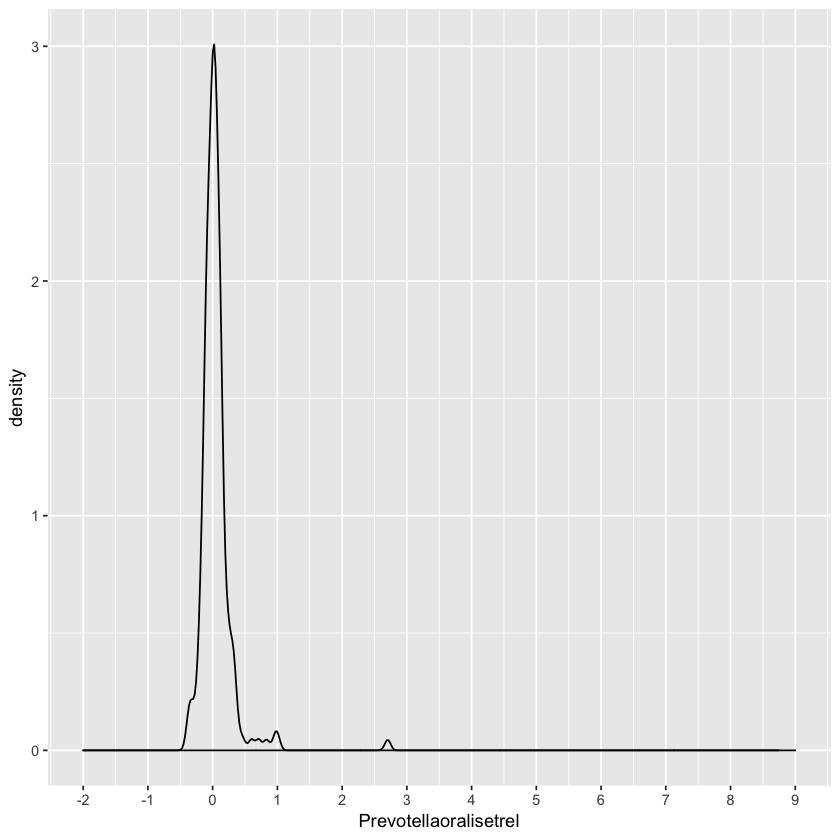

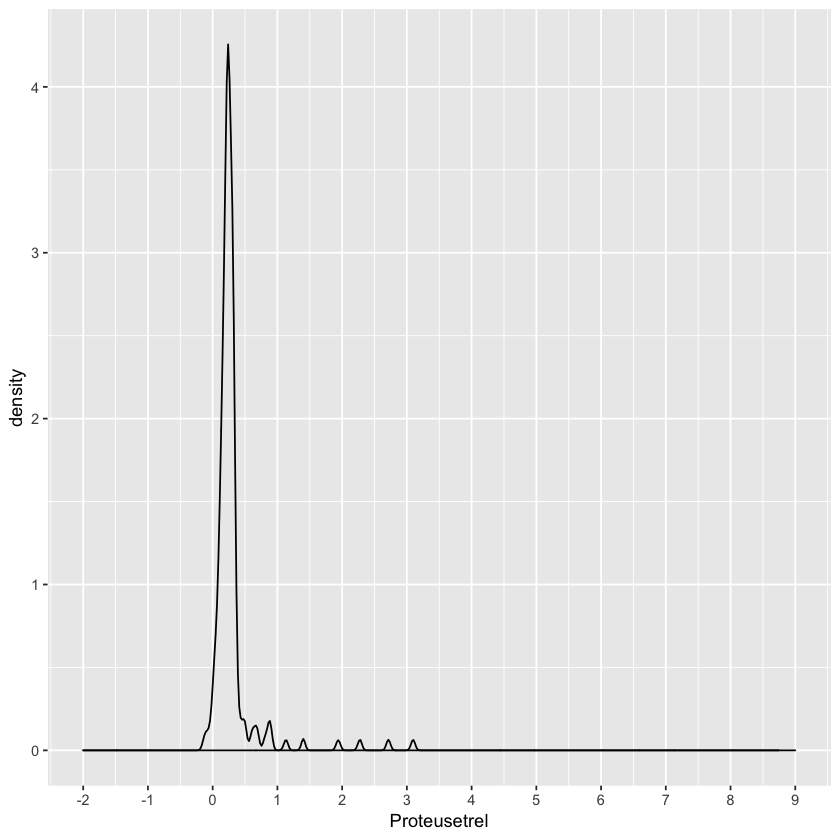

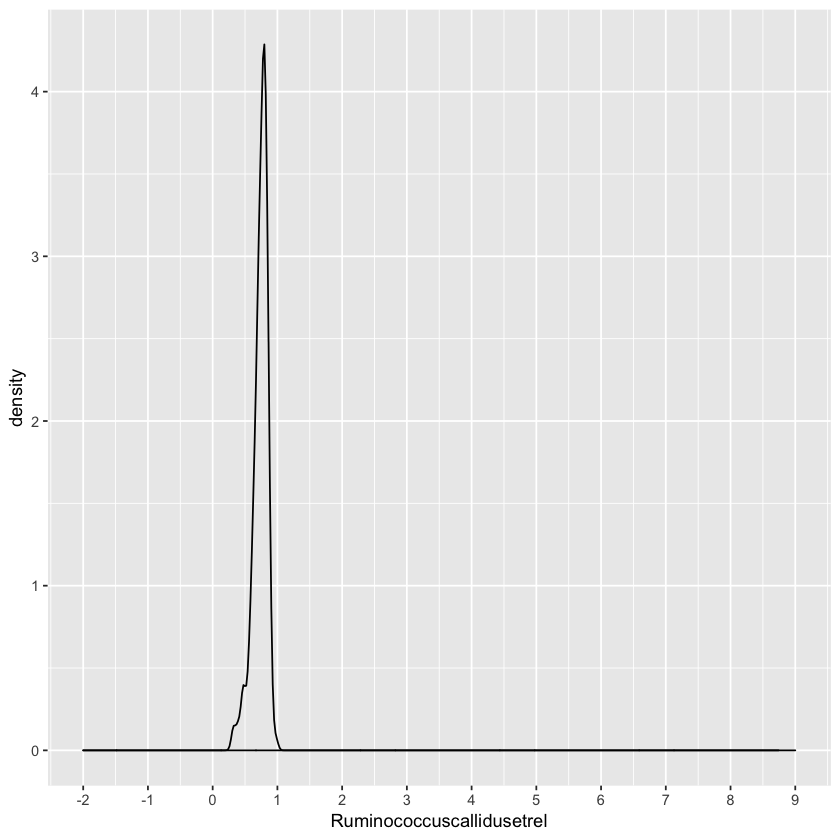

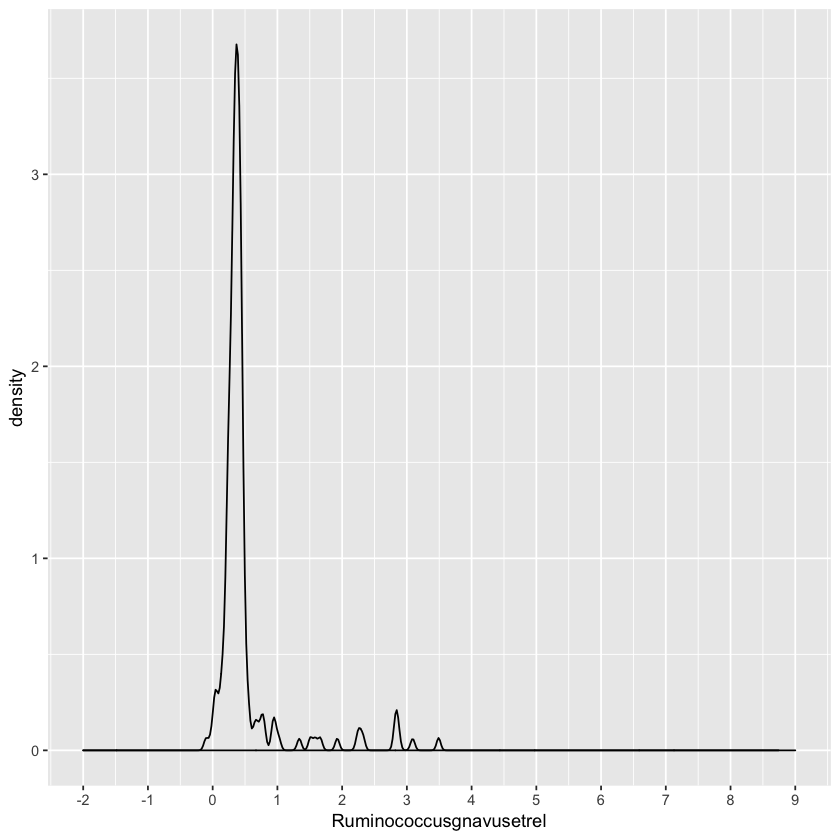

Warning message:
“Removed 3 rows containing non-finite values (stat_density).”

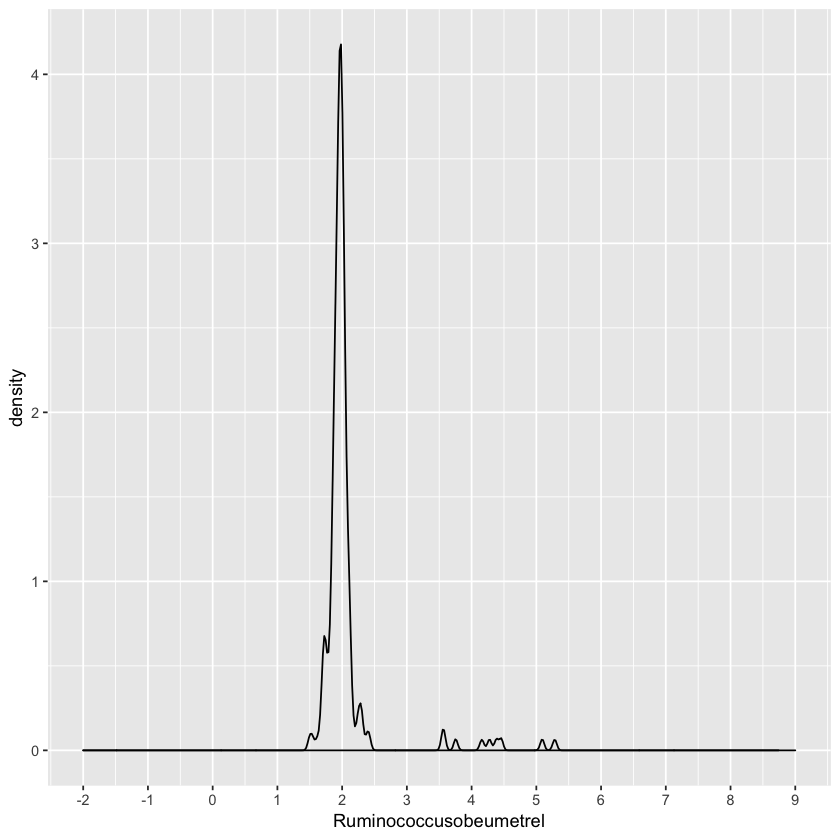

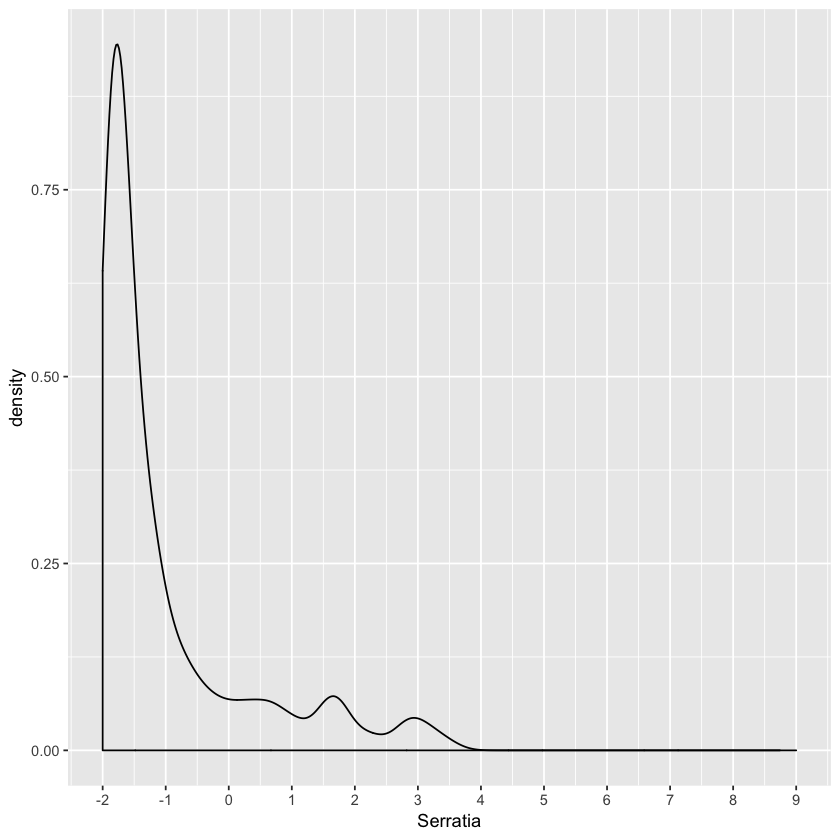

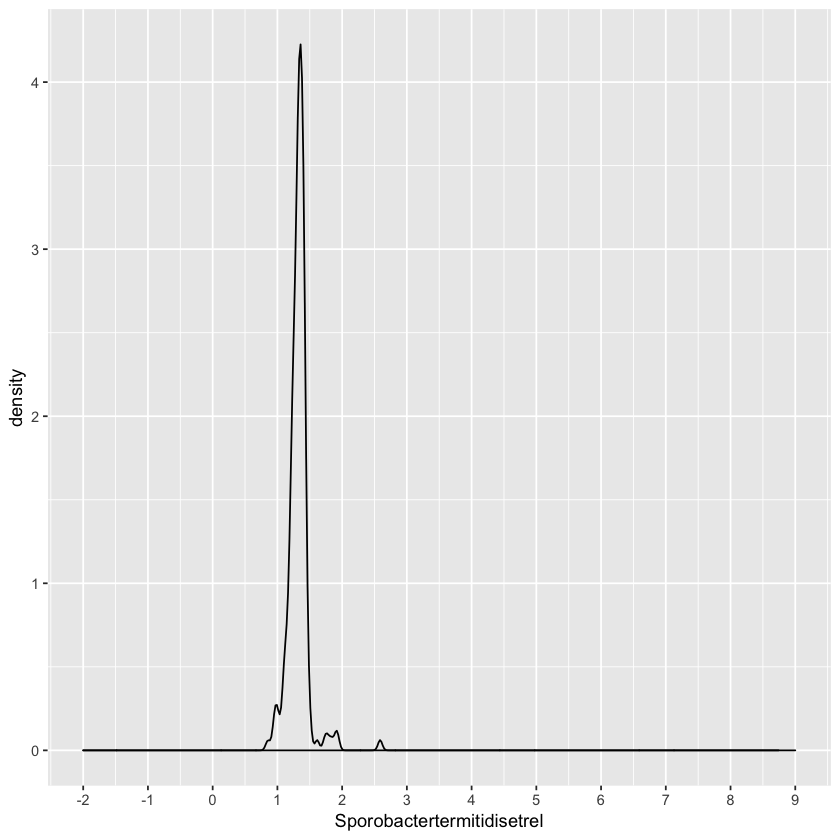

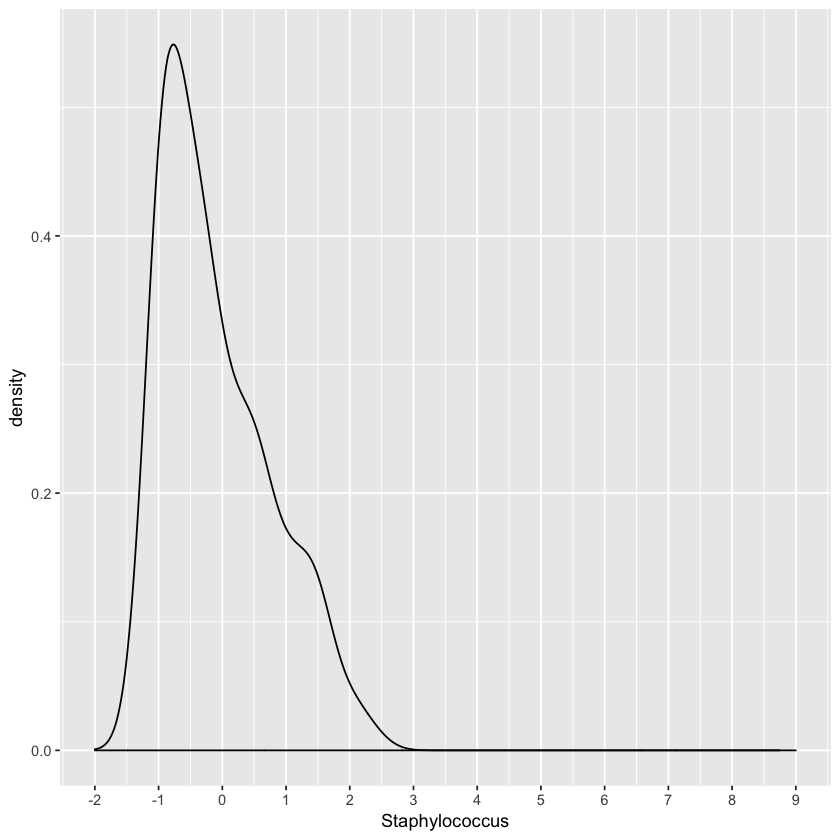

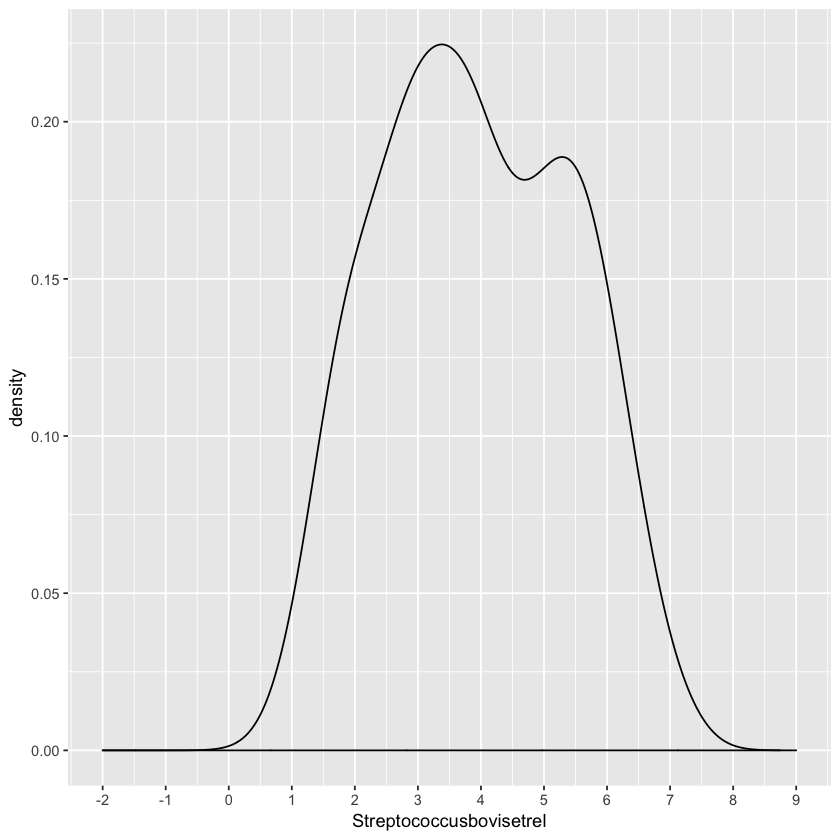

...

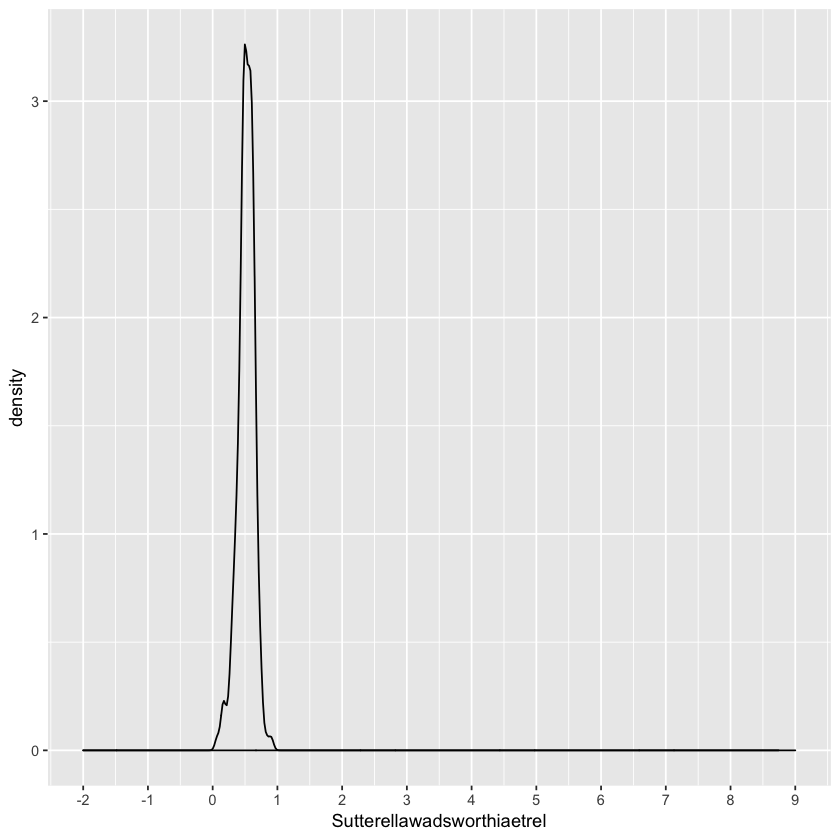

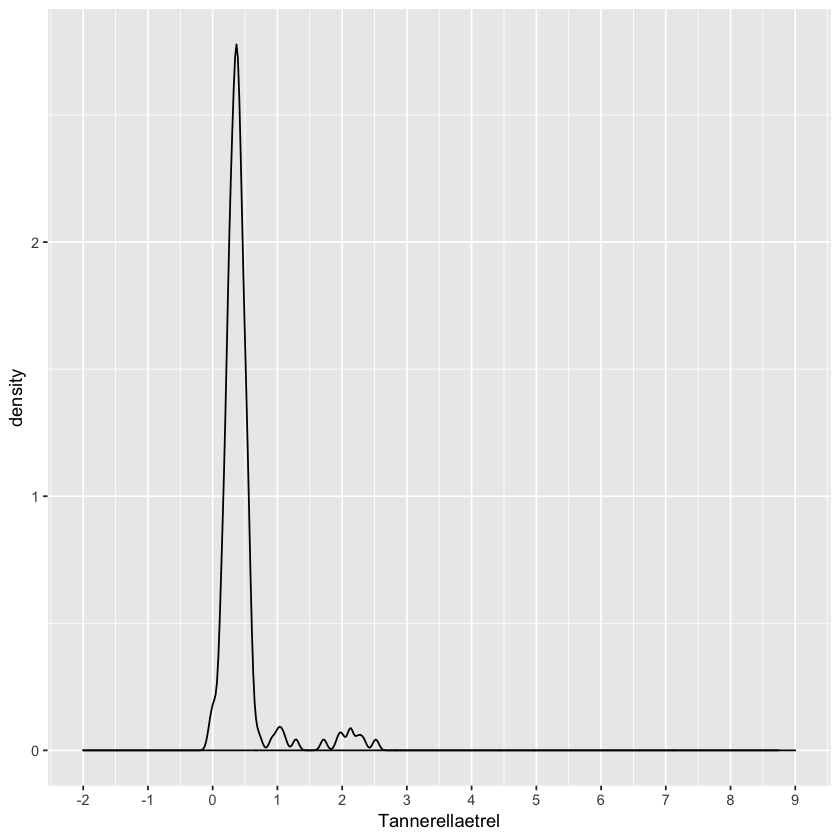

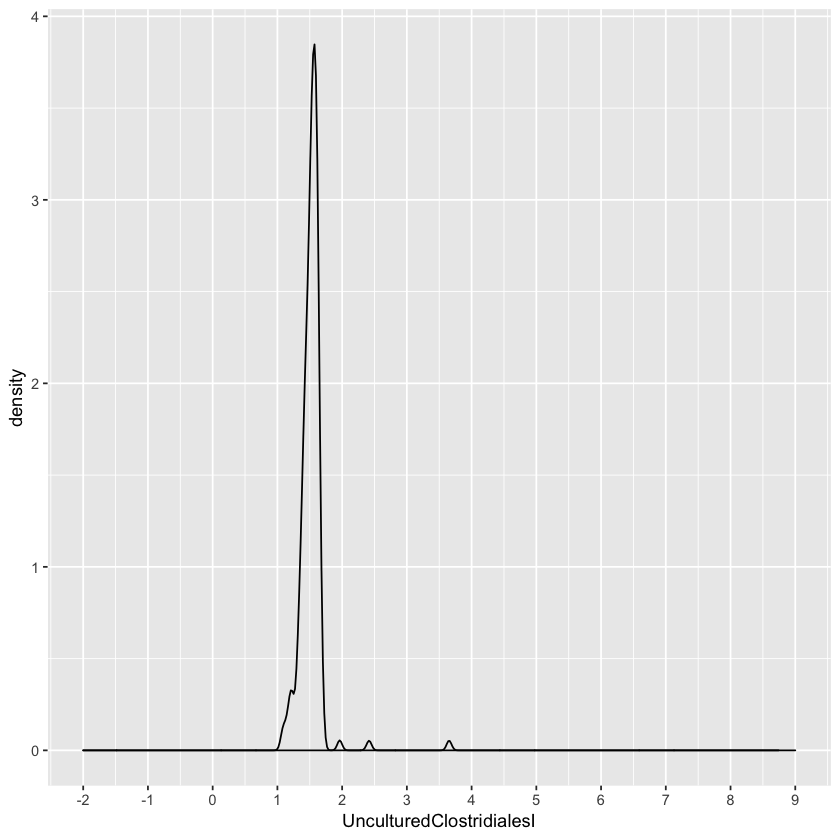

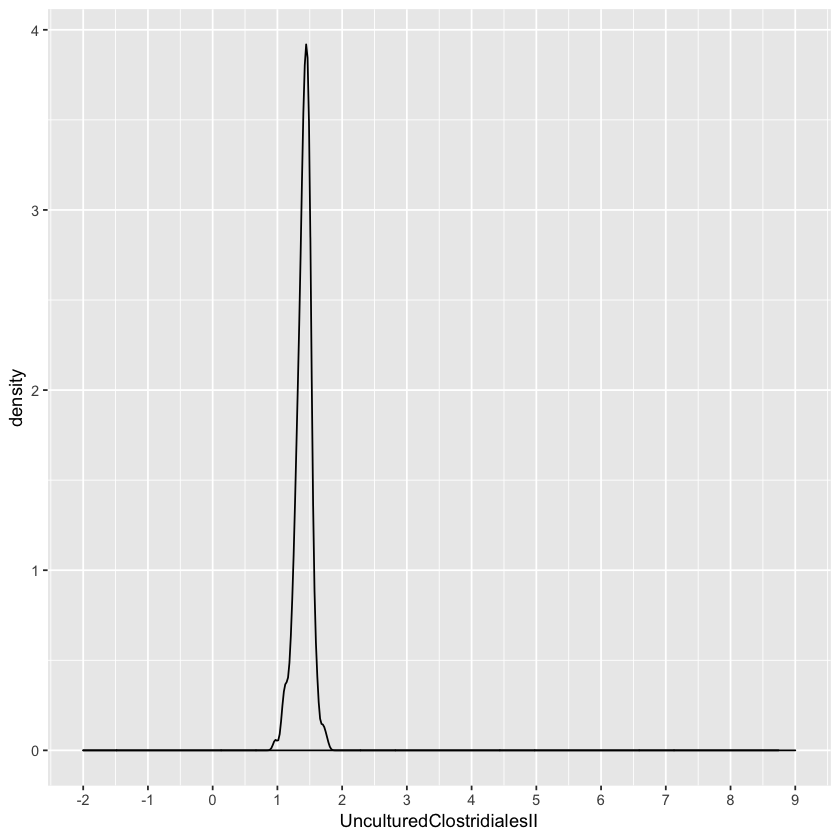

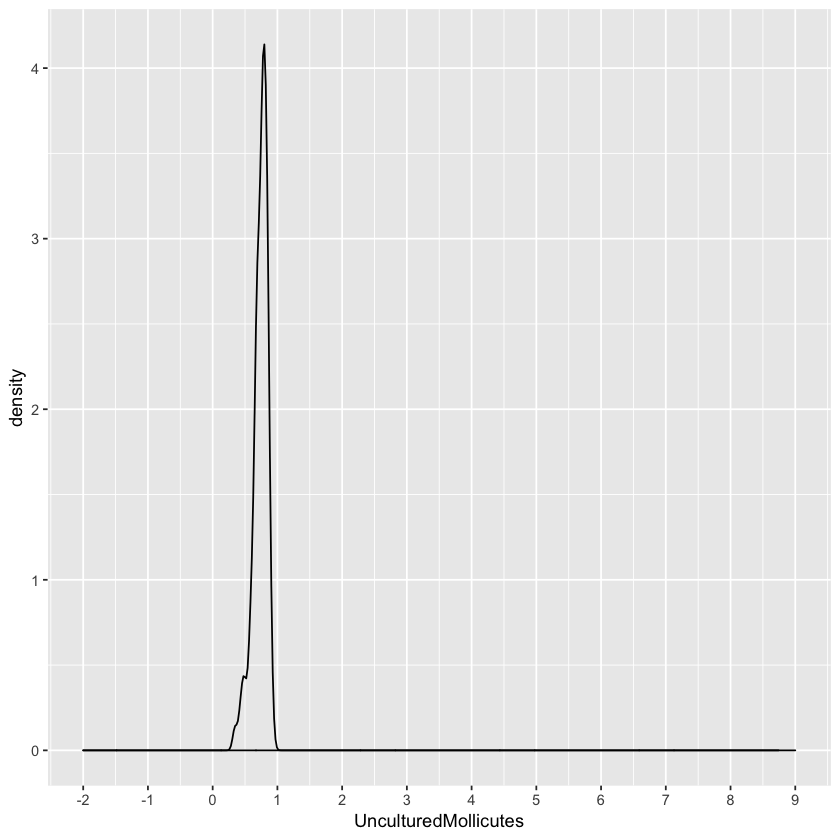

[[1]]

[[2]]

[[3]]

[[4]]

[[5]]

[[6]]

[[7]]

[[8]]

[[9]]

[[10]]

[[11]]

[[12]]

[[13]]

[[14]]

[[15]]

[[16]]

[[17]]

[[18]]

[[19]]

[[20]]

[[21]]

[[22]]

[[23]]

[[24]]

[[25]]

[[26]]

[[27]]

[[28]]

[[29]]

[[30]]

[[31]]

[[32]]

[[33]]

[[34]]

[[35]]

[[36]]

[[37]]

[[38]]

[[39]]

[[40]]

[[41]]

[[42]]

[[43]]

[[44]]

[[45]]

[[46]]

[[47]]

[[48]]

[[49]]

[[50]]

[[51]]

[[52]]

[[53]]

[[54]]

[[55]]

[[56]]

[[57]]

[[58]]

[[59]]

[[60]]

[[61]]

[[62]]

[[63]]

[[64]]

[[65]]

[[66]]

[[67]]

[[68]]

[[69]]

[[70]]

[[71]]

[[72]]

[[73]]


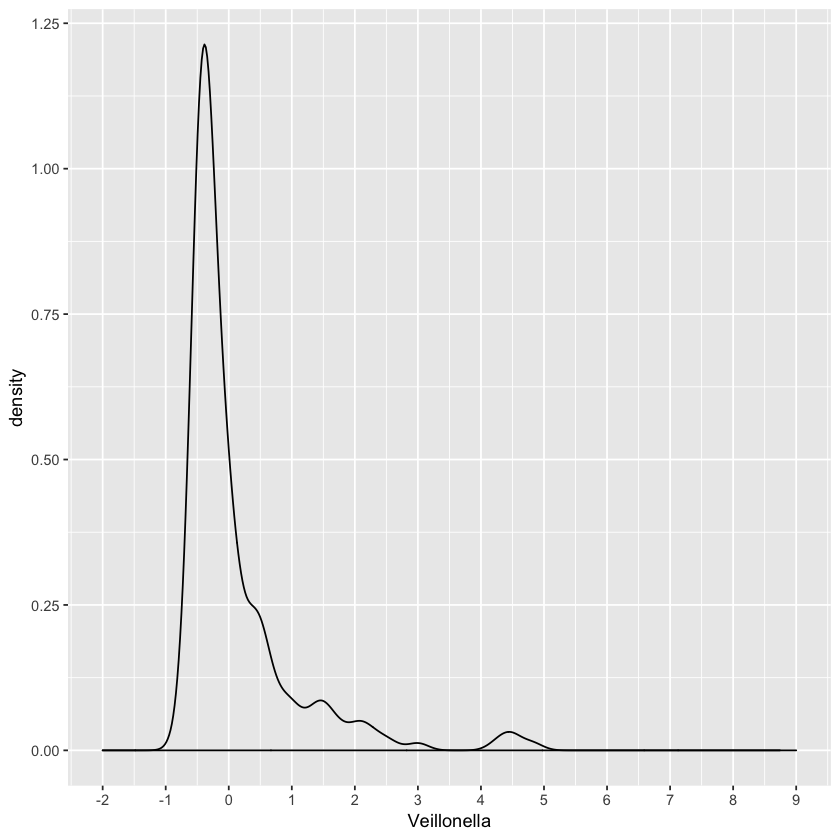

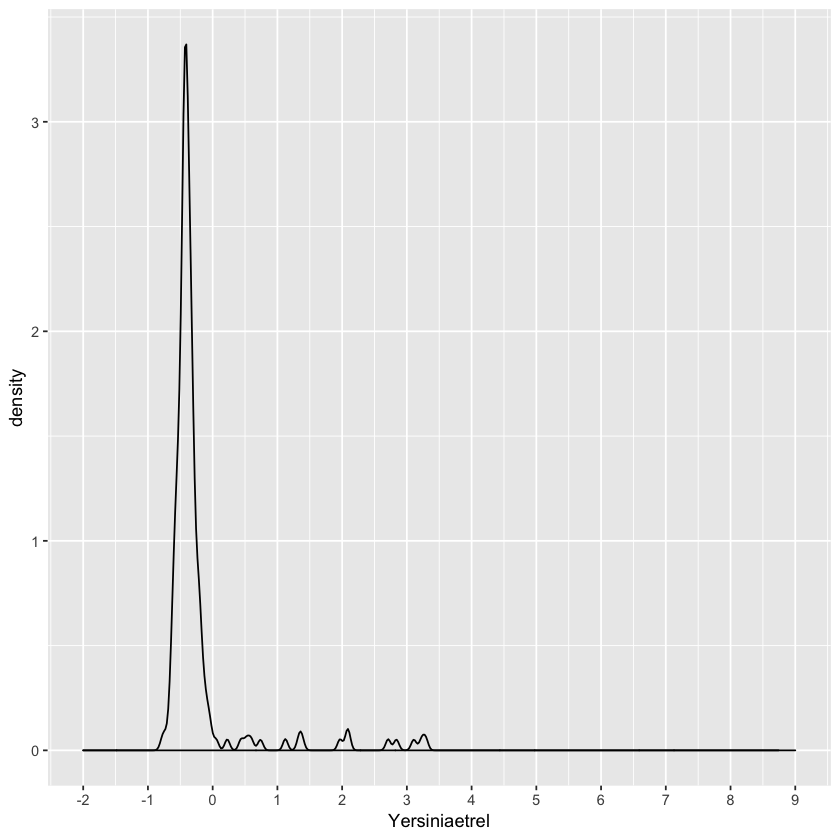

In [29]:
map(unique(test_data$genus), function(genus) {
    test_data %>%
        spread(genus, abundance) %>%
        select(unique(test_data$genus)) %>%
        ggplot(aes_string(genus)) +
            geom_density()+
            scale_x_continuous(breaks = c(-2:9), limits = c(-2, 9))
})

In [276]:
# fit example model
fit_g <- brm(
    data = data_imp[[1]],
    family = gaussian(),
    formula = bf(formula_mu, formula_sigma),
    prior = c(prior(normal(0, 1), class = b),
              prior(normal(0, 4), class = Intercept, dpar = sigma),
              prior(normal(0, 0.2), class = b, dpar = sigma)),
    file = here(glue("models/test_Bifidobacterium_prior7_gaussian22")),
    control = list(adapt_delta = 0.95, max_treedepth = 15)
)

In [277]:
# fit example model
fit_g2 <- brm(
    data = data_imp[[1]],
    family = gaussian(),
    formula = bf(formula_mu),
    prior = c(prior(normal(0, 1), class = b)),
    file = here(glue("models/test_Bifidobacterium_prior7_gaussian223")),
    control = list(adapt_delta = 0.95, max_treedepth = 15)
)

Compiling the C++ model
recompiling to avoid crashing R session
Start sampling



SAMPLING FOR MODEL 'aeababdf0fa63fbb9db1002eb015c0ec' NOW (CHAIN 1).
Chain 1: 
Chain 1: Gradient evaluation took 7.3e-05 seconds
Chain 1: 1000 transitions using 10 leapfrog steps per transition would take 0.73 seconds.
Chain 1: Adjust your expectations accordingly!
Chain 1: 
Chain 1: 
Chain 1: Iteration:    1 / 2000 [  0%]  (Warmup)
Chain 1: Iteration:  200 / 2000 [ 10%]  (Warmup)
Chain 1: Iteration:  400 / 2000 [ 20%]  (Warmup)
Chain 1: Iteration:  600 / 2000 [ 30%]  (Warmup)
Chain 1: Iteration:  800 / 2000 [ 40%]  (Warmup)
Chain 1: Iteration: 1000 / 2000 [ 50%]  (Warmup)
Chain 1: Iteration: 1001 / 2000 [ 50%]  (Sampling)
Chain 1: Iteration: 1200 / 2000 [ 60%]  (Sampling)
Chain 1: Iteration: 1400 / 2000 [ 70%]  (Sampling)
Chain 1: Iteration: 1600 / 2000 [ 80%]  (Sampling)
Chain 1: Iteration: 1800 / 2000 [ 90%]  (Sampling)
Chain 1: Iteration: 2000 / 2000 [100%]  (Sampling)
Chain 1: 
Chain 1:  Elapsed Time: 0.894104 seconds (Warm-up)
Chain 1:                0.809628 seconds (Sampling)


In [327]:
formula_mu <- glue("Bifidobacterium ~ time*cc + age_d_s + bf_count_s + sibling*csection + (1|subject_id)") %>% as.formula()
fit_sn <- brm(
    data = data_imp[[1]],
    family = skew_normal(),
    formula = bf(formula_mu, formula_sigma),
    prior = c(prior(normal(0, 1), class = b),
              prior(normal(0, 0.2), class = sd),
              prior(normal(0, 4), class = Intercept, dpar = sigma),
              prior(normal(0, 0.2), class = b, dpar = sigma),
              prior(normal(0, 1), class = alpha)),
    file = here(glue("models/test_bf_prior_sigma5222")),
    control = list(adapt_delta = 0.95, max_treedepth = 15)
)

Compiling the C++ model
Start sampling



SAMPLING FOR MODEL 'bc94263b624c9e3e1943d97c55a83ae7' NOW (CHAIN 1).
Chain 1: 
Chain 1: Gradient evaluation took 0.000138 seconds
Chain 1: 1000 transitions using 10 leapfrog steps per transition would take 1.38 seconds.
Chain 1: Adjust your expectations accordingly!
Chain 1: 
Chain 1: 
Chain 1: Iteration:    1 / 2000 [  0%]  (Warmup)
Chain 1: Iteration:  200 / 2000 [ 10%]  (Warmup)
Chain 1: Iteration:  400 / 2000 [ 20%]  (Warmup)
Chain 1: Iteration:  600 / 2000 [ 30%]  (Warmup)
Chain 1: Iteration:  800 / 2000 [ 40%]  (Warmup)
Chain 1: Iteration: 1000 / 2000 [ 50%]  (Warmup)
Chain 1: Iteration: 1001 / 2000 [ 50%]  (Sampling)
Chain 1: Iteration: 1200 / 2000 [ 60%]  (Sampling)
Chain 1: Iteration: 1400 / 2000 [ 70%]  (Sampling)
Chain 1: Iteration: 1600 / 2000 [ 80%]  (Sampling)
Chain 1: Iteration: 1800 / 2000 [ 90%]  (Sampling)
Chain 1: Iteration: 2000 / 2000 [100%]  (Sampling)
Chain 1: 
Chain 1:  Elapsed Time: 4.67845 seconds (Warm-up)
Chain 1:                2.80928 seconds (Sampling)
C

In [331]:
formula_mu <- glue("Bifidobacterium ~ time*cc + age_d_s + bf_count_s + sibling*csection + (1|subject_id)") %>% as.formula()
fit_sn_fix <- brm(
    data = data_imp[[1]],
    family = skew_normal(),
    formula = bf(formula_mu),
    prior = c(prior(normal(0, 1), class = b),
              prior(normal(0, 0.2), class = sd),
              prior(normal(0, 1), class = alpha)),
    file = here(glue("models/test_bf_prior_sigma522fix2")),
    control = list(adapt_delta = 0.95, max_treedepth = 15)
)

Compiling the C++ model
Start sampling



SAMPLING FOR MODEL 'e09ad64d7ed75636f9c80493aea8049f' NOW (CHAIN 1).
Chain 1: 
Chain 1: Gradient evaluation took 0.000175 seconds
Chain 1: 1000 transitions using 10 leapfrog steps per transition would take 1.75 seconds.
Chain 1: Adjust your expectations accordingly!
Chain 1: 
Chain 1: 
Chain 1: Iteration:    1 / 2000 [  0%]  (Warmup)
Chain 1: Iteration:  200 / 2000 [ 10%]  (Warmup)
Chain 1: Iteration:  400 / 2000 [ 20%]  (Warmup)
Chain 1: Iteration:  600 / 2000 [ 30%]  (Warmup)
Chain 1: Iteration:  800 / 2000 [ 40%]  (Warmup)
Chain 1: Iteration: 1000 / 2000 [ 50%]  (Warmup)
Chain 1: Iteration: 1001 / 2000 [ 50%]  (Sampling)
Chain 1: Iteration: 1200 / 2000 [ 60%]  (Sampling)
Chain 1: Iteration: 1400 / 2000 [ 70%]  (Sampling)
Chain 1: Iteration: 1600 / 2000 [ 80%]  (Sampling)
Chain 1: Iteration: 1800 / 2000 [ 90%]  (Sampling)
Chain 1: Iteration: 2000 / 2000 [100%]  (Sampling)
Chain 1: 
Chain 1:  Elapsed Time: 2.97309 seconds (Warm-up)
Chain 1:                2.14092 seconds (Sampling)
C

In [142]:
df <- data_imp[[1]]

In [306]:
10^0.3

[1] 1.995262

student is fine...
# A tibble: 1 x 3
  median  mean    sd
   <dbl> <dbl> <dbl>
1  0.598 0.596 0.980
student2 is fine...
# A tibble: 1 x 3
  median   mean    sd
   <dbl>  <dbl> <dbl>
1  0.213 -0.543  340.


Warning message:
“Removed 3737 rows containing missing values (geom_point).”

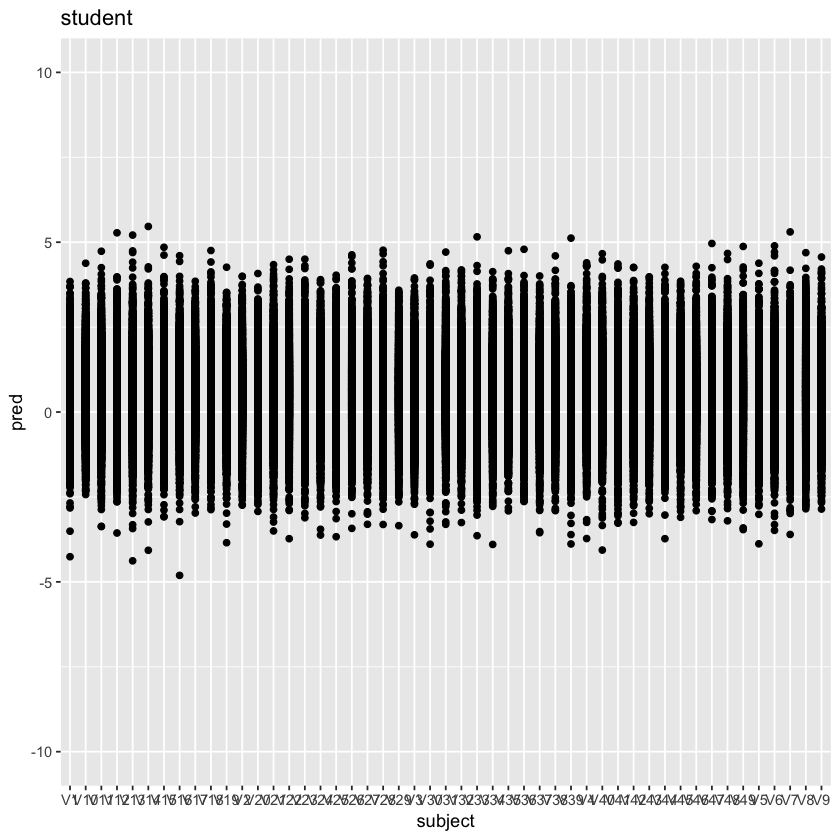

gaussian is fine...
# A tibble: 1 x 3
  median  mean    sd
   <dbl> <dbl> <dbl>
1  0.621 0.619  1.01


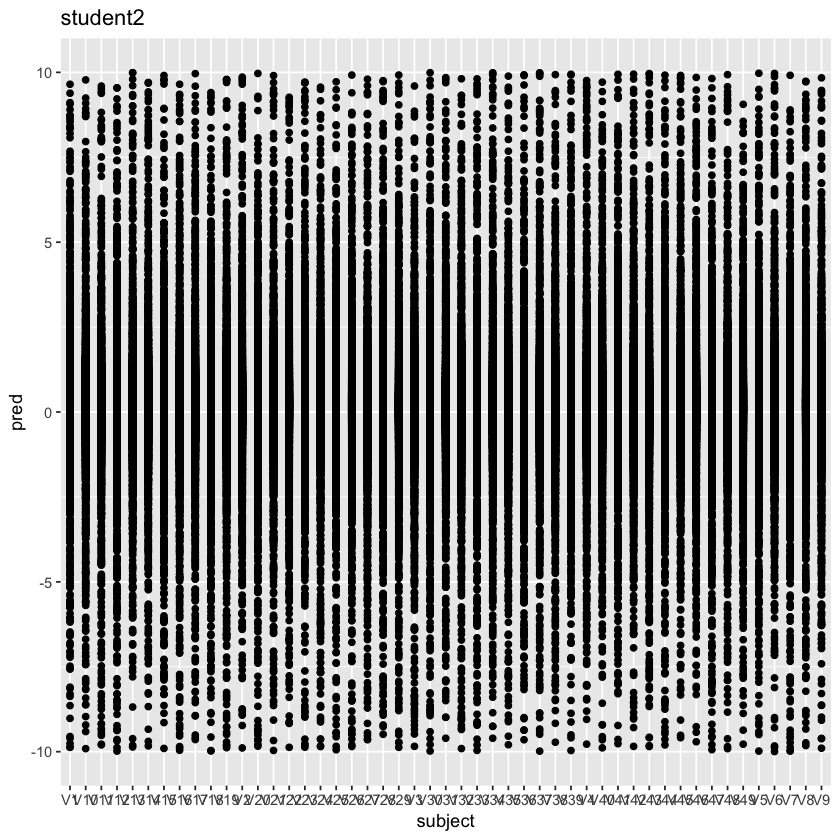

gaussian_fix is fine...
# A tibble: 1 x 3
  median  mean    sd
   <dbl> <dbl> <dbl>
1  0.566 0.567  1.30


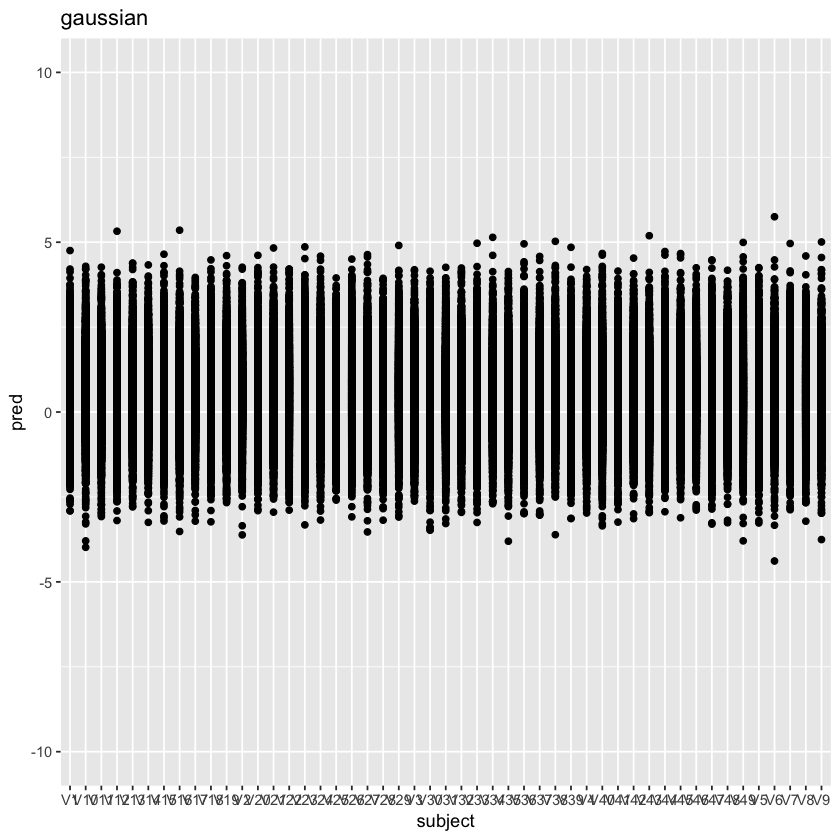

sn is fine...
# A tibble: 1 x 3
  median  mean    sd
   <dbl> <dbl> <dbl>
1  0.475 0.536  1.37


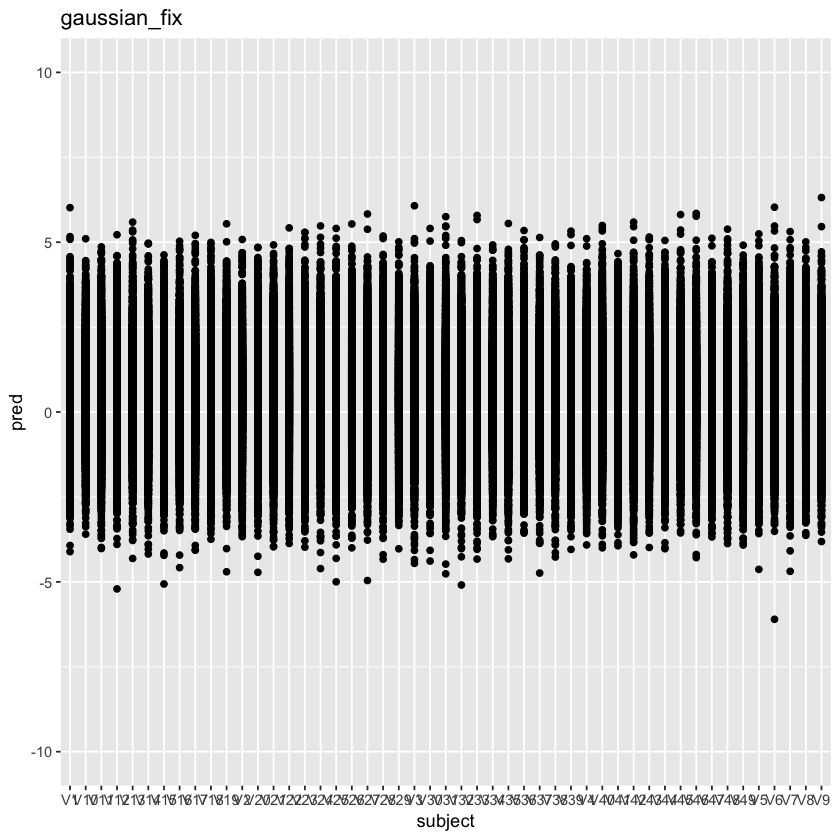

sn_fix is fine...
# A tibble: 1 x 3
  median  mean    sd
   <dbl> <dbl> <dbl>
1  0.338 0.340  1.56


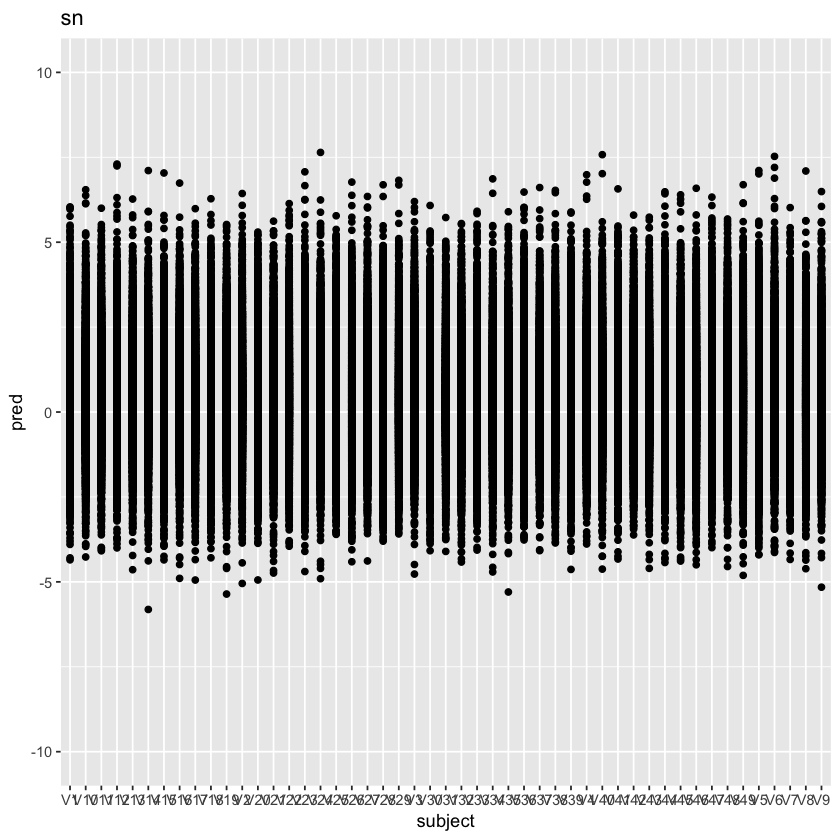

Warning message:
“Removed 2 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 2 rows containing missing values (geom_point).”

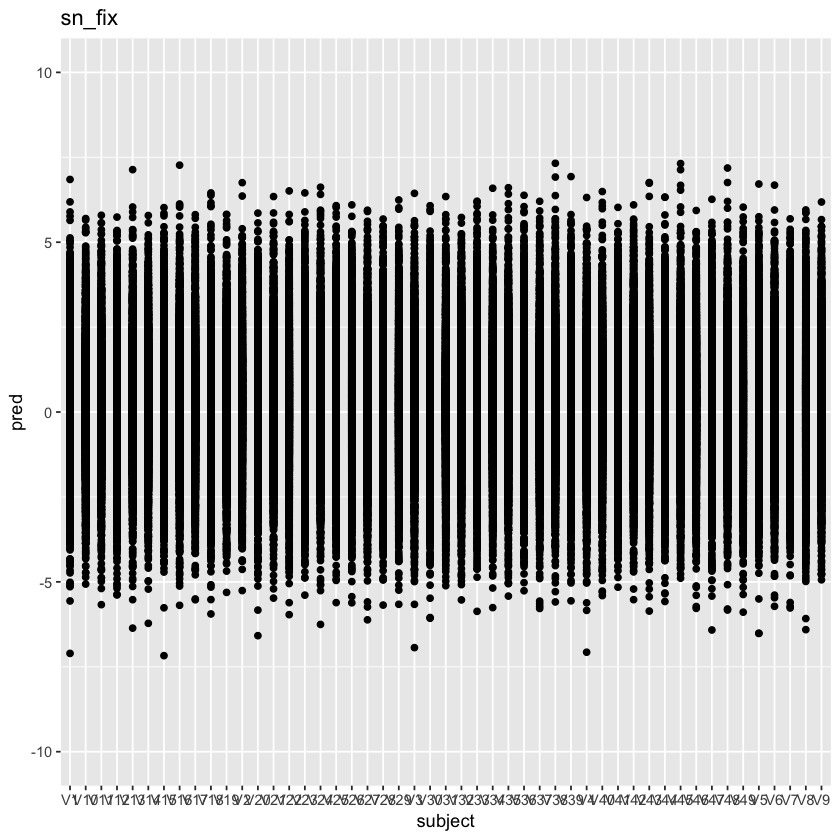

Warning message:
“Removed 57 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 57 rows containing missing values (geom_point).”

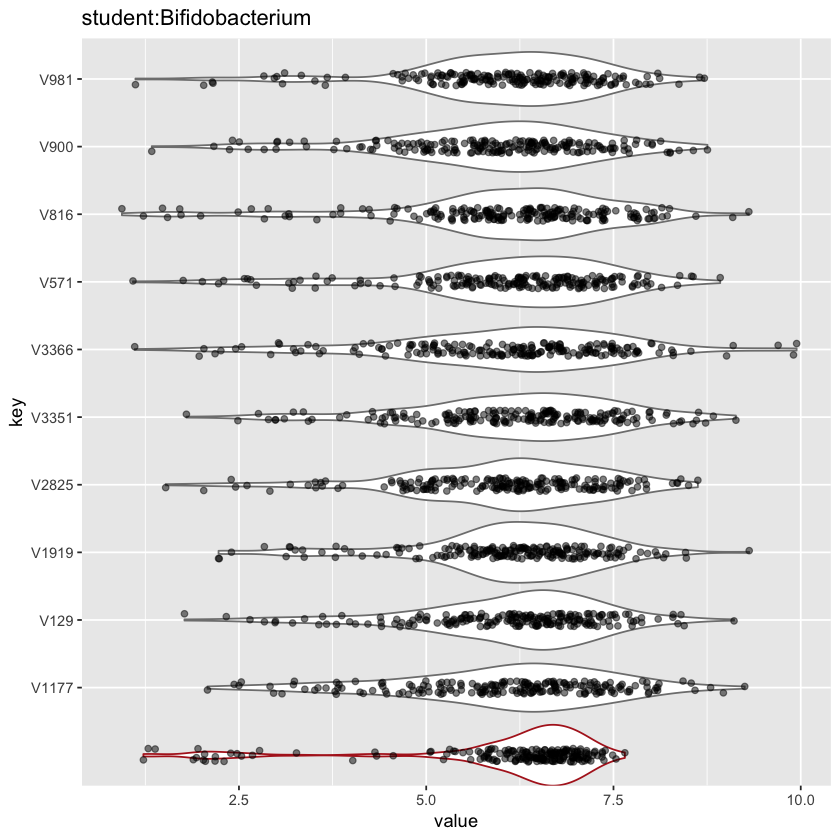

Warning message:
“Removed 3 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 3 rows containing missing values (geom_point).”

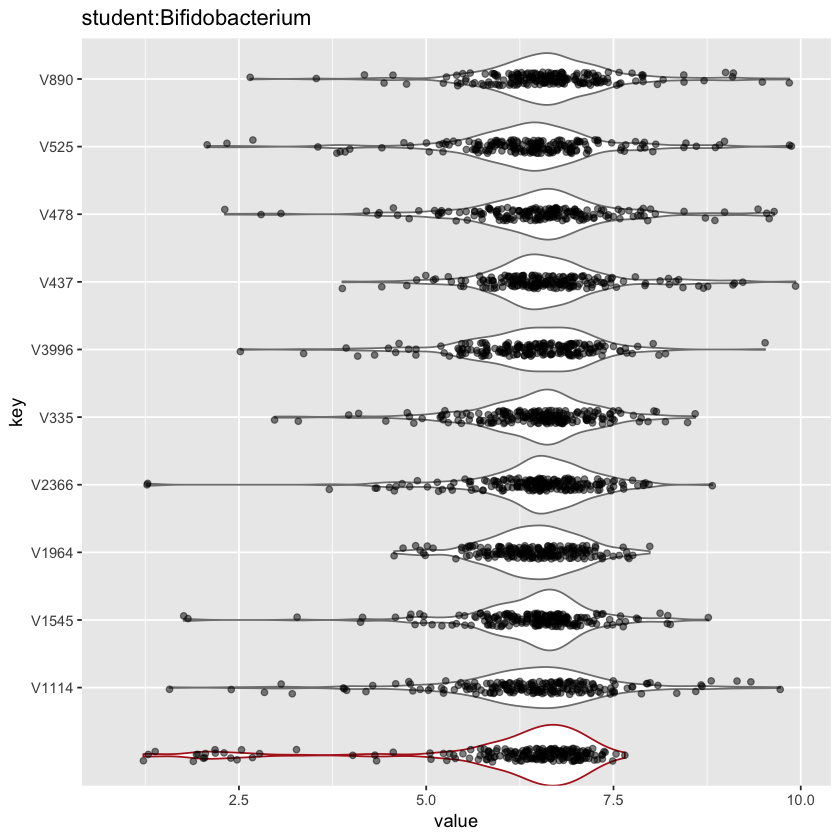

Warning message:
“Removed 4 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 4 rows containing missing values (geom_point).”

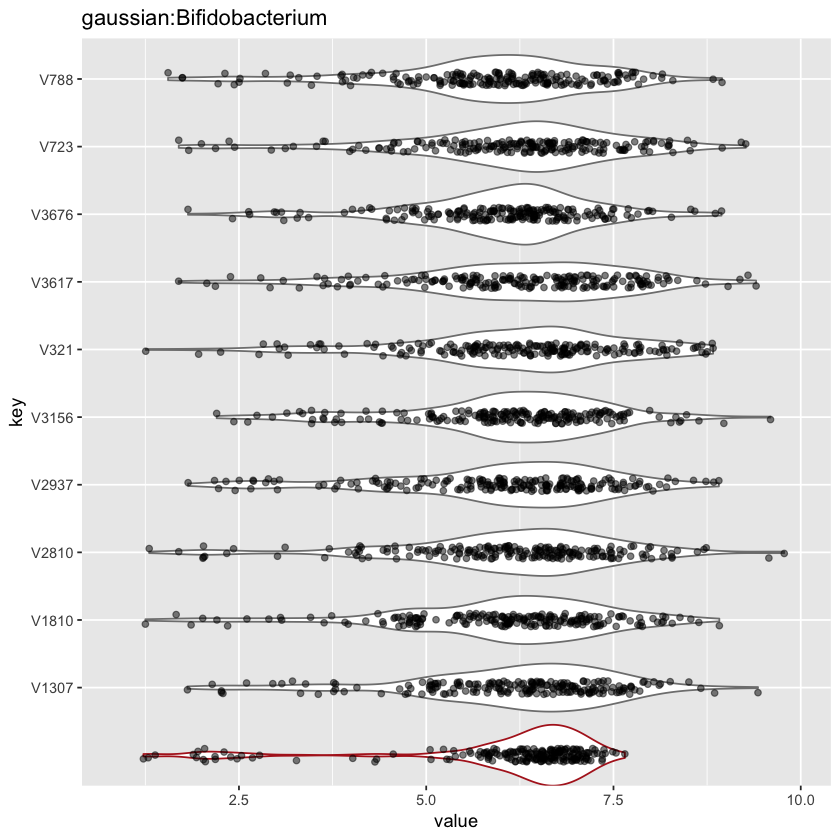

Warning message:
“Removed 1 rows containing non-finite values (stat_ydensity).”Warning message:
“Removed 1 rows containing missing values (geom_point).”

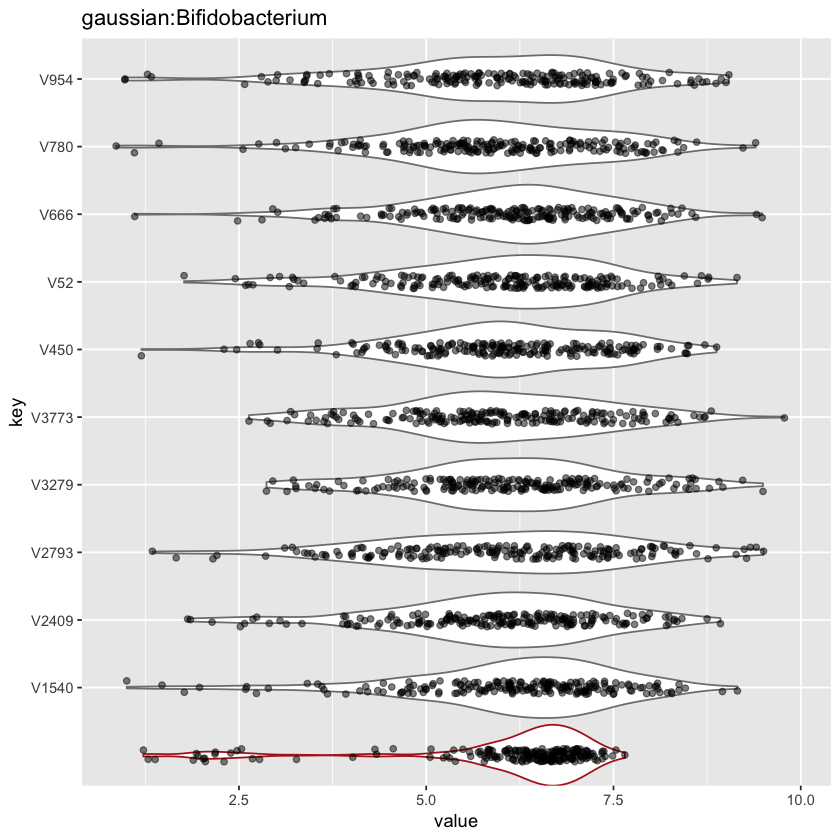

[[1]]

[[2]]

[[3]]

[[4]]

[[5]]

[[6]]


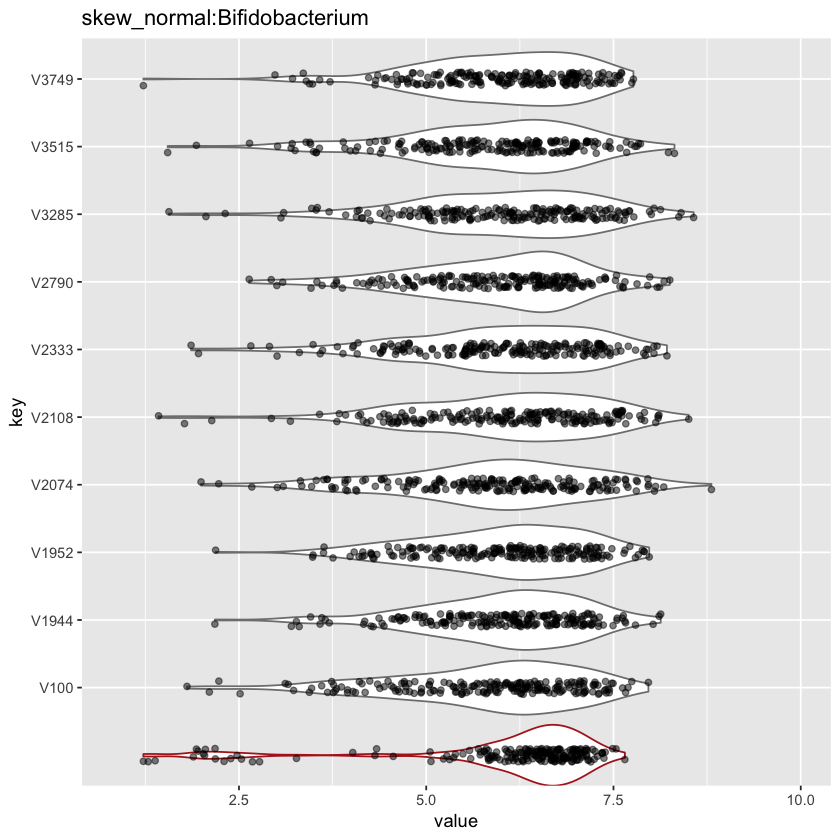

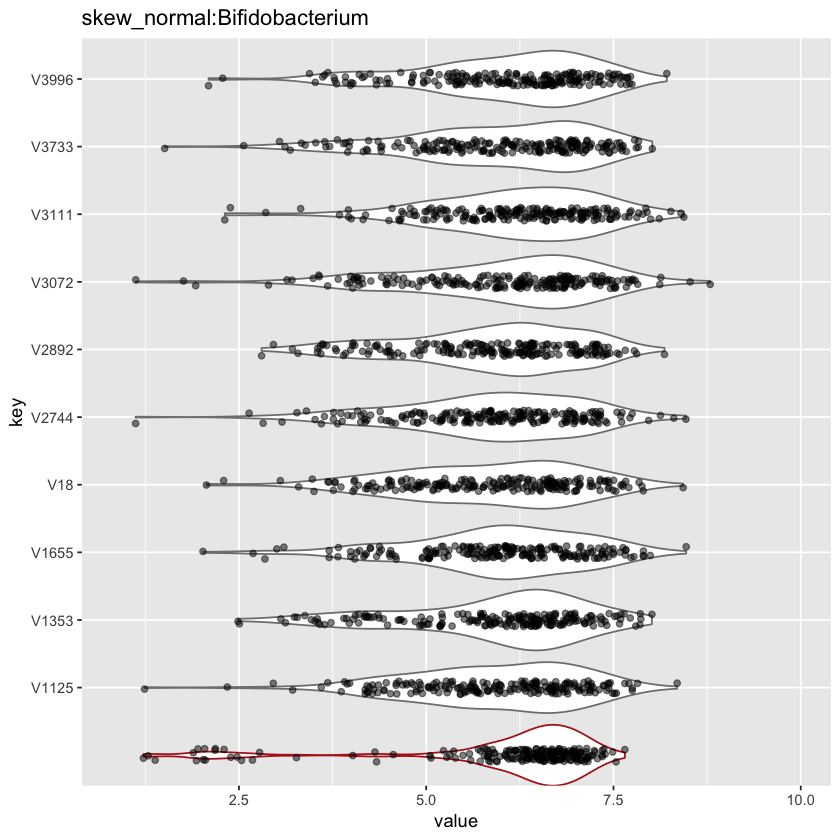

In [333]:
map2(
    list(fit_t, fit_t2, fit_g, fit_g2, fit_sn, fit_sn_fix), 
    list("student", "student2", "gaussian", "gaussian_fix", "sn", "sn_fix"),
    function(fit, title) {
        if (return_diag(fit, "Bifidobacterium")) print(glue("{title} is fine...")) else print(glue("{title} is not fine"))
        # generate representative predictions
        data_ccyes_post <- df %>% filter(cc == "yes", time == "post")
        ppd_ccyes_post <- posterior_predict(fit, newdata = data_ccyes_post)
        data_ccno_post <- data_ccyes_post %>% mutate(cc = levels(data_ccyes_post$cc)[1])
        ppd_ccno_post <- posterior_predict(fit, newdata = data_ccno_post)
        ppd_diff <- ppd_ccyes_post - ppd_ccno_post
        fitted_ccyes_post <- fitted(fit, newdata = data_ccyes_post, summary = F)
        fitted_ccno_post <- fitted(fit, newdata = data_ccno_post, summary = F)
        fitted_diff <- fitted_ccyes_post - fitted_ccno_post
        print(ppd_diff %>% as_tibble() %>%
            gather(subject, pred) %>%
            summarise(median = median(pred), mean = mean(pred), sd = sd(pred)))
        print(ppd_diff %>% as_tibble() %>%
            gather(subject, pred) %>%
            ggplot(aes(subject, pred)) +
            geom_point() +
            ylim(-10, 10) +
            ggtitle(title))   
        pp_plot_v2(fit, 10, "Bifidobacterium")
})


# A tibble: 1 x 3
  median  mean    sd
   <dbl> <dbl> <dbl>
1  -1.16 -1.16  1.26


Warning message:
“Removed 1 rows containing missing values (geom_point).”

# A tibble: 1 x 3
  median  mean    sd
   <dbl> <dbl> <dbl>
1 -0.526 0.378  854.


Warning message:
“Removed 14099 rows containing missing values (geom_point).”

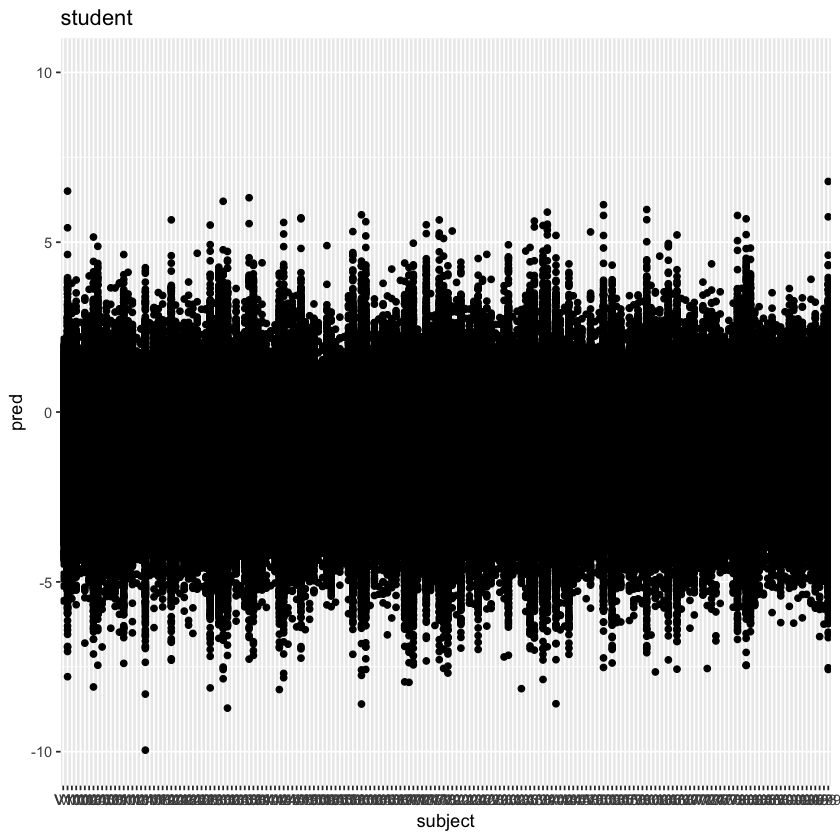

# A tibble: 1 x 3
  median  mean    sd
   <dbl> <dbl> <dbl>
1  -1.14 -1.14  1.29


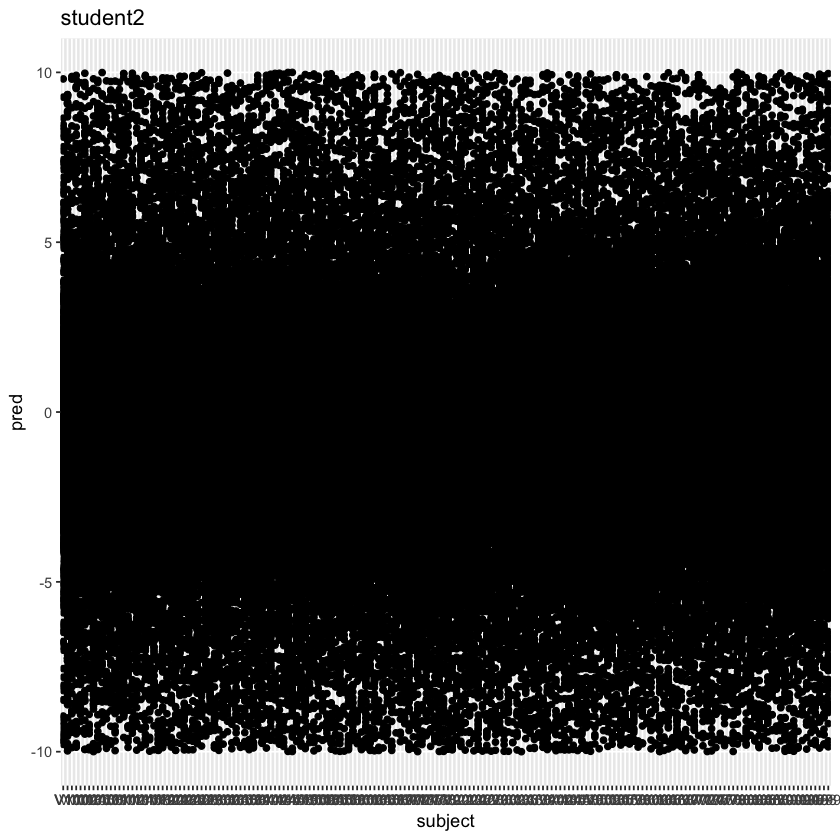

# A tibble: 1 x 3
  median  mean    sd
   <dbl> <dbl> <dbl>
1  -1.15 -1.15  1.37


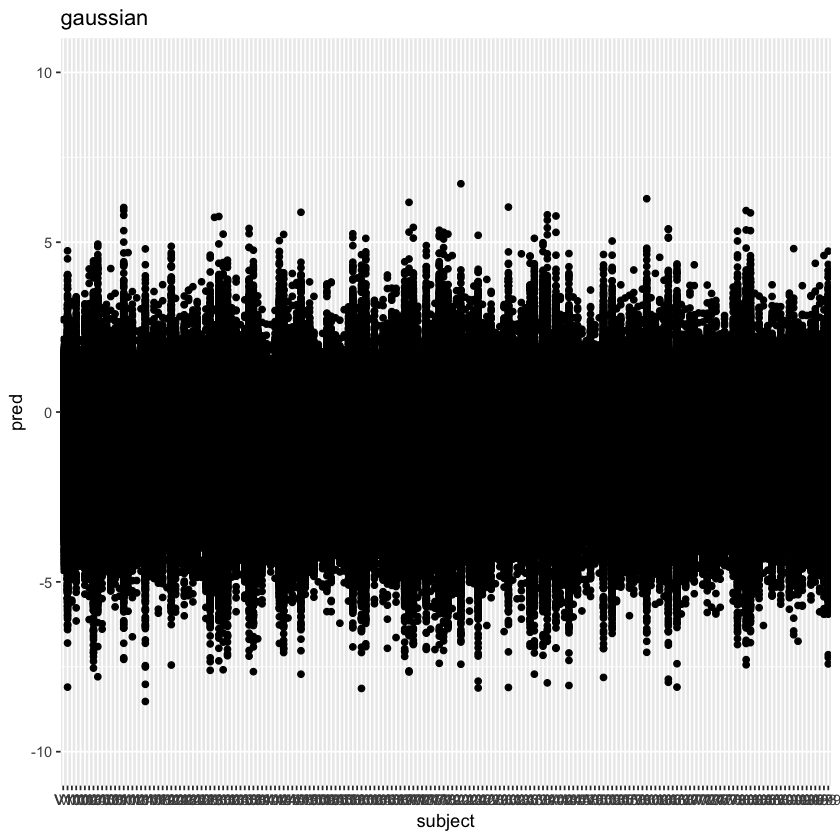

# A tibble: 1 x 3
  median   mean    sd
   <dbl>  <dbl> <dbl>
1 -0.631 -0.630  1.62


Warning message:
“Removed 1 rows containing missing values (geom_point).”

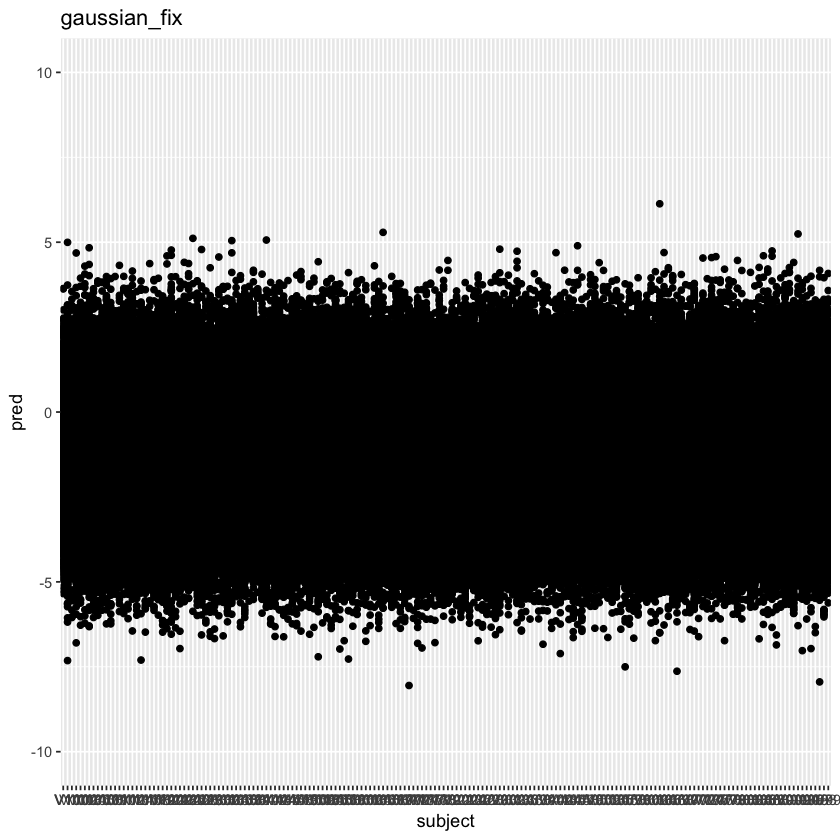

# A tibble: 1 x 3
  median   mean    sd
   <dbl>  <dbl> <dbl>
1 -0.624 -0.628  1.59


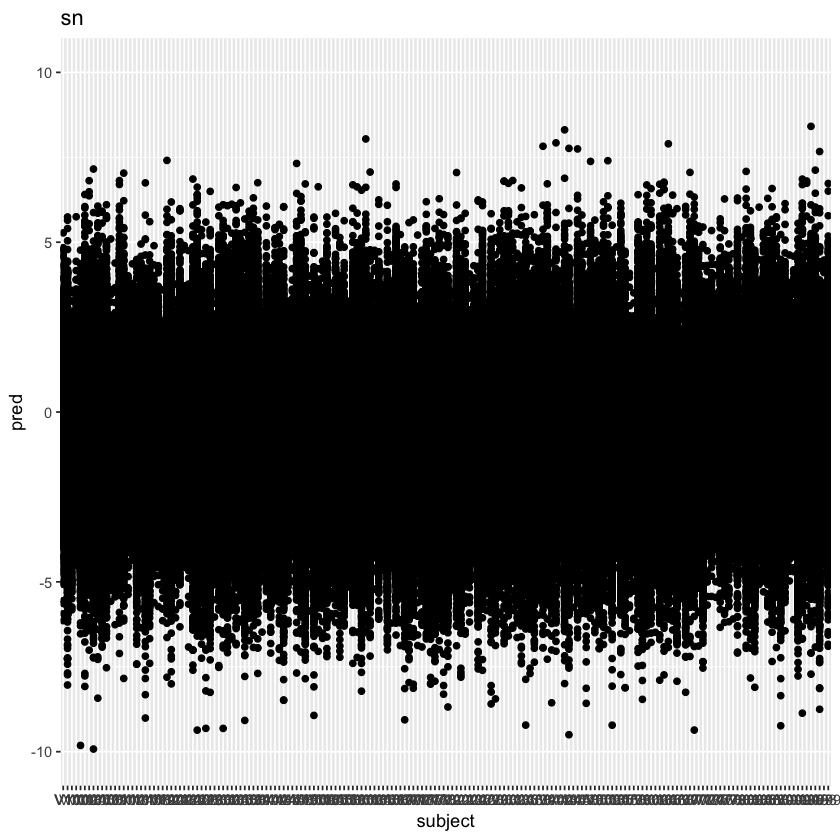

Warning message:
“Removed 2 rows containing non-finite values (stat_density).”

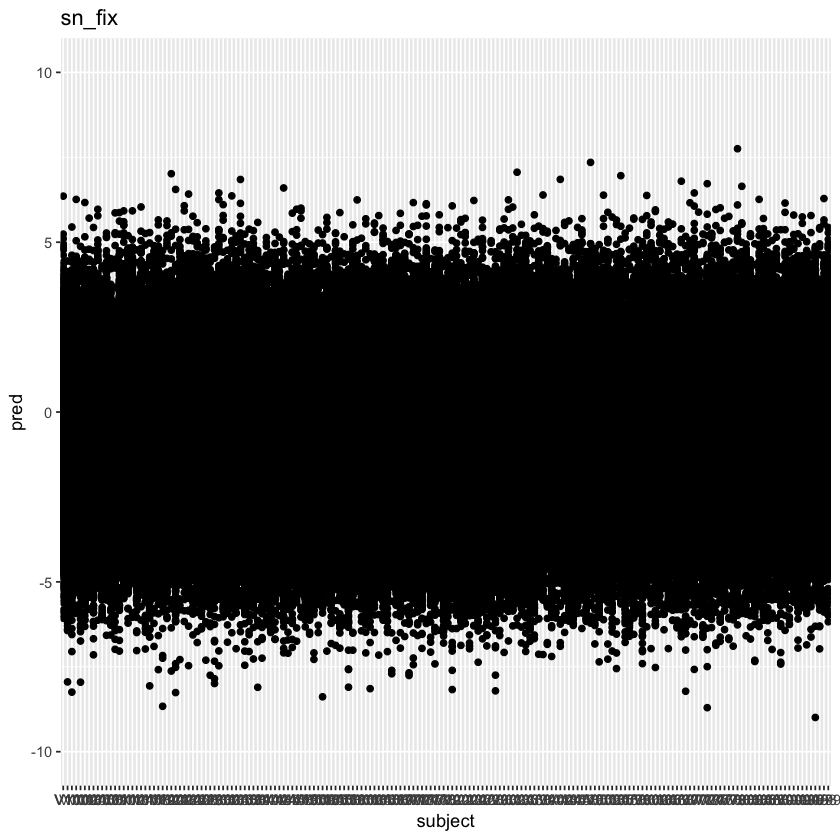

Warning message:
“Removed 49 rows containing non-finite values (stat_density).”

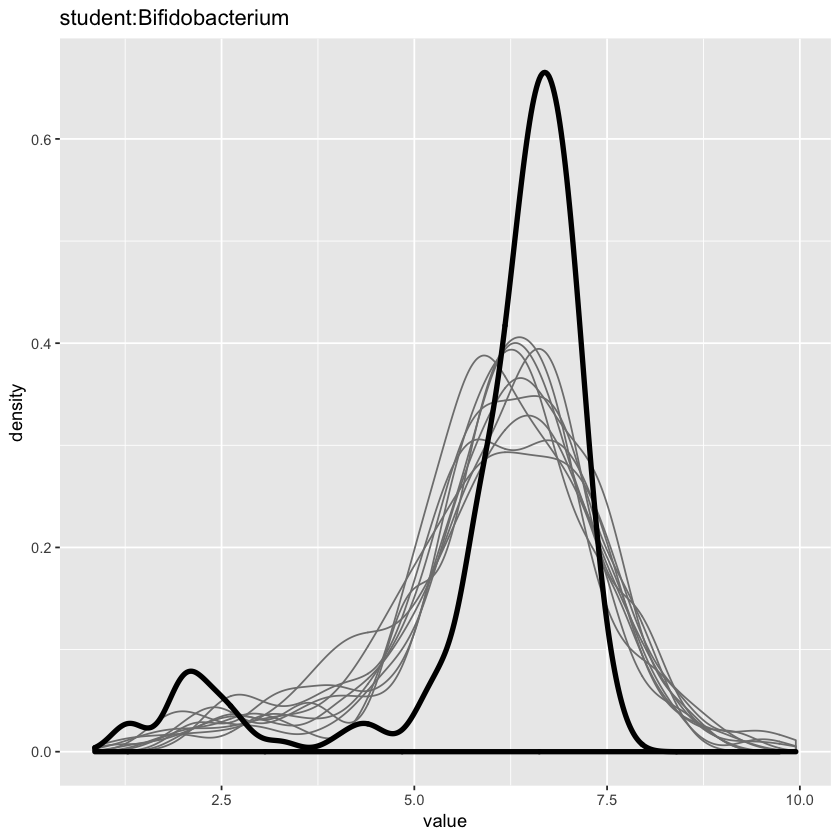

Warning message:
“Removed 2 rows containing non-finite values (stat_density).”

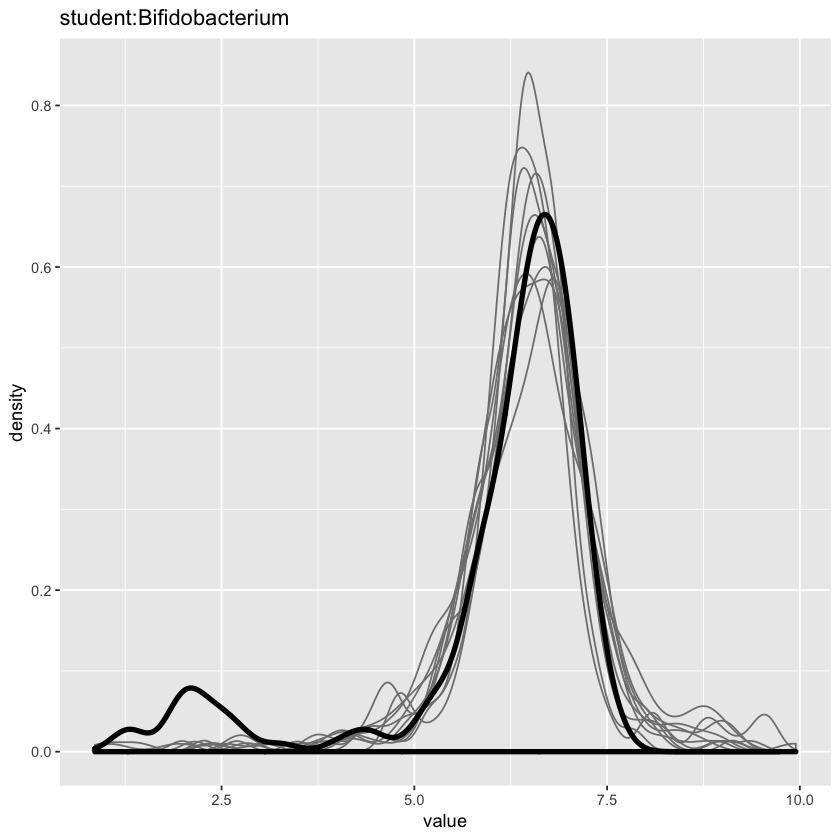

Warning message:
“Removed 5 rows containing non-finite values (stat_density).”

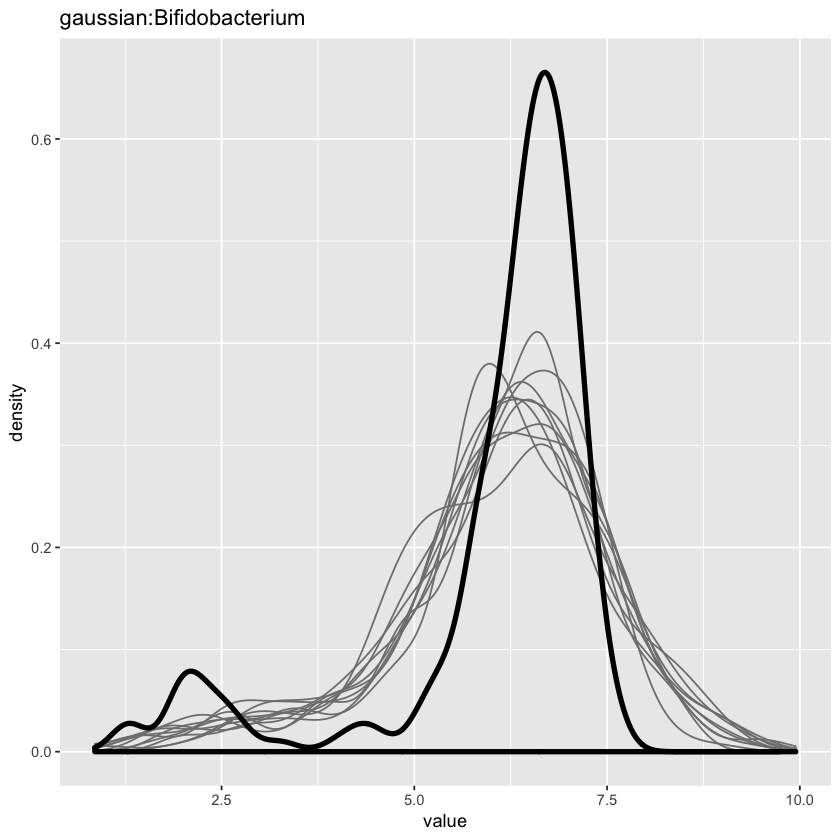

Warning message:
“Removed 5 rows containing non-finite values (stat_density).”

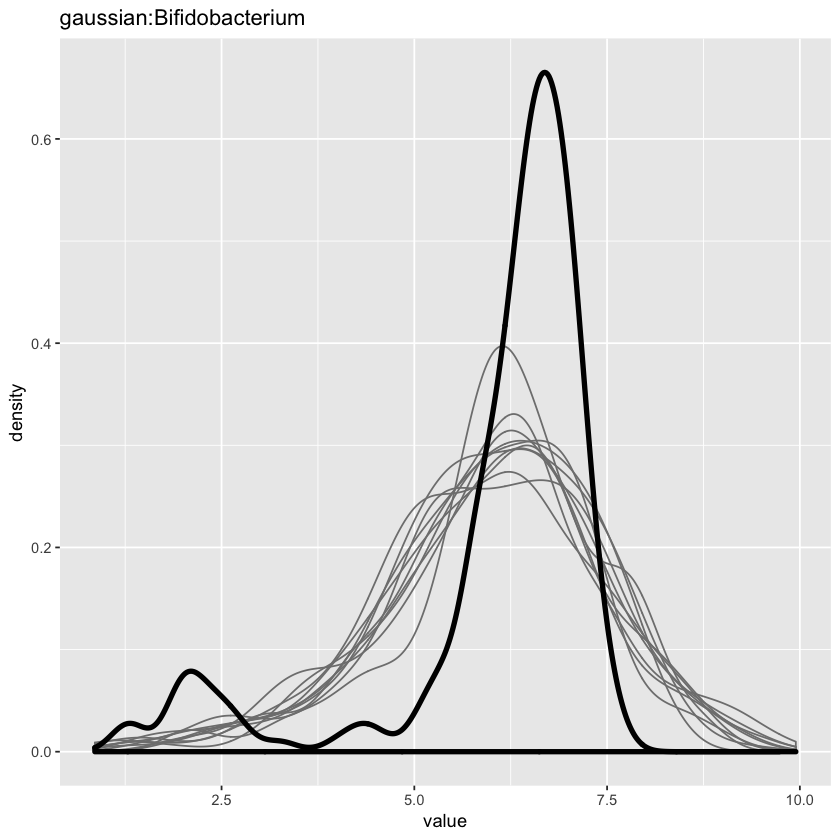

Warning message:
“Removed 1 rows containing non-finite values (stat_density).”

[[1]]

[[2]]

[[3]]

[[4]]

[[5]]

[[6]]


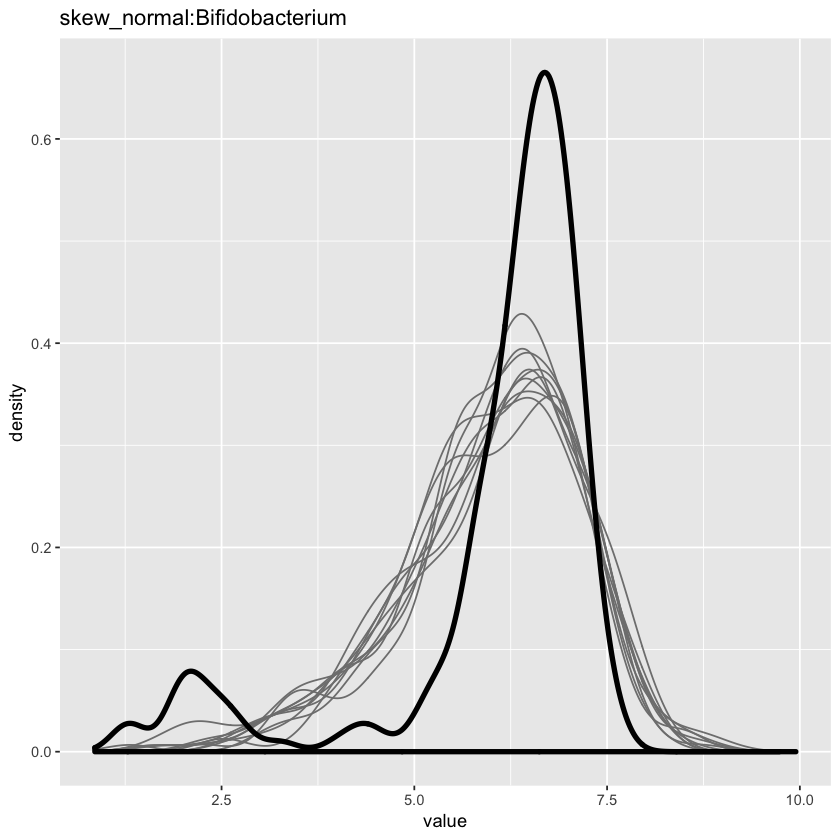

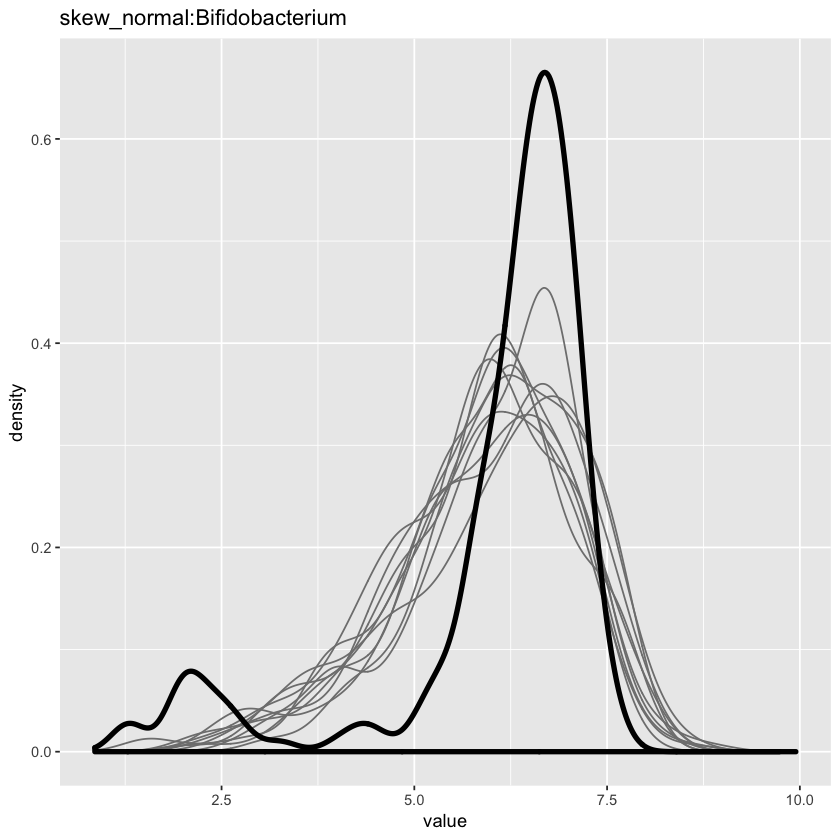

In [334]:
map2(
    list(fit_t, fit_t2, fit_g, fit_g2, fit_sn, fit_sn_fix), 
    list("student", "student2", "gaussian", "gaussian_fix", "sn", "sn_fix"),
    function(fit, title) {
        # generate representative predictions
        data_nocsection <- df %>% filter(csection == "0")
        ppd_nocsection <- posterior_predict(fit, newdata = data_nocsection)
        data_csection <- data_nocsection %>% mutate(csection = levels(csection)[2])
        ppd_csection <- posterior_predict(fit, newdata = data_csection)
        ppd_diff <- ppd_csection - ppd_nocsection
        fitted_ccyes_post <- fitted(fit, newdata = data_ccyes_post, summary = F)
        fitted_ccno_post <- fitted(fit, newdata = data_ccno_post, summary = F)
        fitted_diff <- fitted_ccyes_post - fitted_ccno_post
        print(ppd_diff %>% as_tibble() %>%
            gather(subject, pred) %>%
            summarise(median = median(pred), mean = mean(pred), sd = sd(pred)))
        print(ppd_diff %>% as_tibble() %>%
            gather(subject, pred) %>%
            ggplot(aes(subject, pred)) +
            geom_point() +
            ylim(-10, 10) +
            ggtitle(title))   
        pp_plot(fit, 10, "Bifidobacterium")
})


In [121]:
# generate representative predictions
data_ccyes_post <- df %>% filter(cc == "yes", time == "post")
ppd_ccyes_post <- posterior_predict(fit2, newdata = data_ccyes_post)
data_ccno_post <- data_ccyes_post %>% mutate(cc = levels(data_ccyes_post$cc)[1])
ppd_ccno_post <- posterior_predict(fit2, newdata = data_ccno_post)
ppd_diff <- ppd_ccyes_post - ppd_ccno_post
head(data_ccyes_post)
head(data_ccno_post)

subject_id,age_d_s,time,cc,bf_count_s,sibling,birthweight_s,csection,PC1,PC2,⋯,UnculturedClostridialesI,UnculturedClostridialesII,UnculturedMollicutes,UnculturedSelenomonadaceae,Veillonella,Vibrio,Weissellaetrel,Wissellaetrel,Xanthomonadaceae,Yersiniaetrel
388,0.0320946,post,yes,-1.65710371,0,0.5238208,1,2.1772307,2.2224135,⋯,1.520612,1.402049,0.7529886,-1.886635,-0.4276279,-0.48058307,-0.6305419,-1.871706,-1.1035973,-0.4674334
381,0.5275689,post,yes,0.64565004,0,1.7973020,0,-3.8048090,-3.3623966,⋯,1.358990,1.214344,0.5915839,-2.070707,1.4098122,-0.58935008,-0.7658898,-2.065654,-1.1978351,-0.6346190
283,0.4795079,post,yes,0.09005391,0,0.5238208,1,0.5556697,-1.3475015,⋯,1.610124,1.466770,0.8462103,-1.808476,-0.3150395,-0.41845018,-0.6420515,-1.821147,-0.9773721,-0.3960776
422,1.5680649,post,yes,-1.65710371,0,-1.0892555,0,2.6421183,0.8904990,⋯,1.536854,1.352708,0.7043030,-1.943444,0.9603685,0.08709943,-0.5560920,-1.696683,-1.0782342,-0.5413970
319,0.5275689,post,yes,-1.65710371,0,0.2691245,0,0.6104380,-0.1514912,⋯,1.564166,1.418973,0.7955044,-1.857459,-0.4820317,-0.46252742,-0.6558476,-1.792958,-0.8334610,-0.4363580
321,0.1311895,post,yes,0.13373285,0,1.0968873,0,-1.4342585,3.1405704,⋯,1.375698,1.317883,0.6109127,-2.040470,-0.2451099,-0.42235332,-0.6303670,-2.008523,-1.0344817,-0.2388035


subject_id,age_d_s,time,cc,bf_count_s,sibling,birthweight_s,csection,PC1,PC2,⋯,UnculturedClostridialesI,UnculturedClostridialesII,UnculturedMollicutes,UnculturedSelenomonadaceae,Veillonella,Vibrio,Weissellaetrel,Wissellaetrel,Xanthomonadaceae,Yersiniaetrel
388,0.0320946,post,no,-1.65710371,0,0.5238208,1,2.1772307,2.2224135,⋯,1.520612,1.402049,0.7529886,-1.886635,-0.4276279,-0.48058307,-0.6305419,-1.871706,-1.1035973,-0.4674334
381,0.5275689,post,no,0.64565004,0,1.7973020,0,-3.8048090,-3.3623966,⋯,1.358990,1.214344,0.5915839,-2.070707,1.4098122,-0.58935008,-0.7658898,-2.065654,-1.1978351,-0.6346190
283,0.4795079,post,no,0.09005391,0,0.5238208,1,0.5556697,-1.3475015,⋯,1.610124,1.466770,0.8462103,-1.808476,-0.3150395,-0.41845018,-0.6420515,-1.821147,-0.9773721,-0.3960776
422,1.5680649,post,no,-1.65710371,0,-1.0892555,0,2.6421183,0.8904990,⋯,1.536854,1.352708,0.7043030,-1.943444,0.9603685,0.08709943,-0.5560920,-1.696683,-1.0782342,-0.5413970
319,0.5275689,post,no,-1.65710371,0,0.2691245,0,0.6104380,-0.1514912,⋯,1.564166,1.418973,0.7955044,-1.857459,-0.4820317,-0.46252742,-0.6558476,-1.792958,-0.8334610,-0.4363580
321,0.1311895,post,no,0.13373285,0,1.0968873,0,-1.4342585,3.1405704,⋯,1.375698,1.317883,0.6109127,-2.040470,-0.2451099,-0.42235332,-0.6303670,-2.008523,-1.0344817,-0.2388035


mean,sd
0.01215979,2.460953


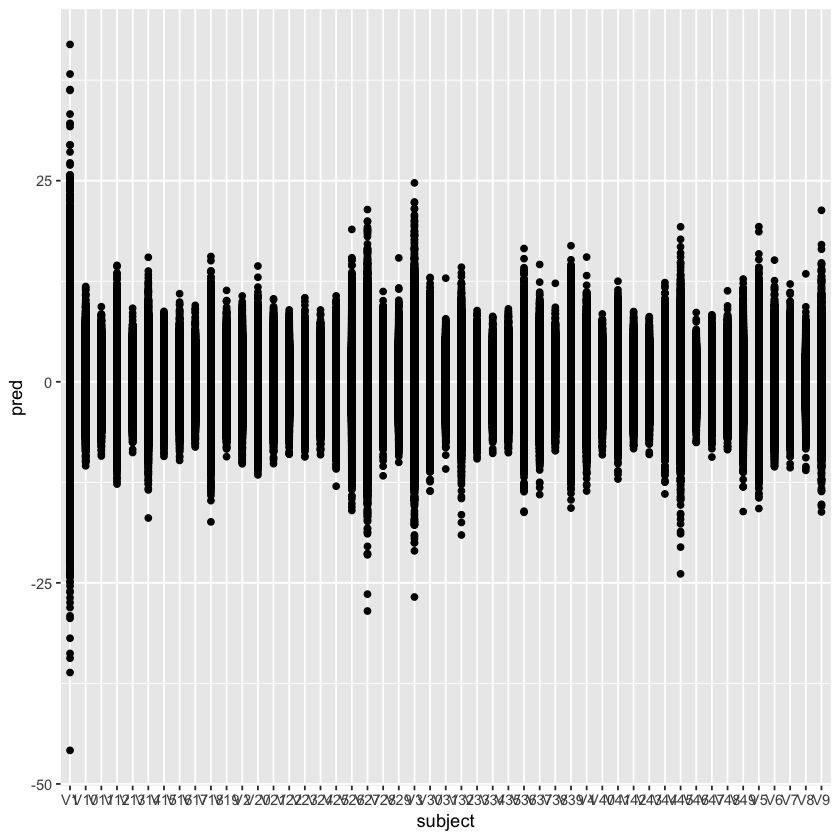

In [122]:
ppd_diff %>% as_tibble() %>%
    gather(subject, pred) %>%
    summarise(mean = mean(pred), sd = sd(pred))
ppd_diff %>% as_tibble() %>%
    gather(subject, pred) %>%
    ggplot(aes(subject, pred)) +
    geom_point()

In [254]:
# generate representative predictions
data_ccyes_post <- df %>% filter(cc == "yes", time == "post")
ppd_ccyes_post <- posterior_predict(fit3, newdata = data_ccyes_post)
data_ccno_post <- data_ccyes_post %>% mutate(cc = levels(data_ccyes_post$cc)[1])
ppd_ccno_post <- posterior_predict(fit3, newdata = data_ccno_post)
ppd_diff <- ppd_ccyes_post - ppd_ccno_post
head(data_ccyes_post)
head(data_ccno_post)

subject_id,age_d_s,time,cc,bf_count_s,sibling,birthweight_s,csection,PC1,PC2,⋯,UnculturedClostridialesI,UnculturedClostridialesII,UnculturedMollicutes,UnculturedSelenomonadaceae,Veillonella,Vibrio,Weissellaetrel,Wissellaetrel,Xanthomonadaceae,Yersiniaetrel
388,0.0320946,post,yes,-1.65710371,0,0.5238208,1,2.1772307,2.2224135,⋯,1.520612,1.402049,0.7529886,-1.886635,-0.4276279,-0.48058307,-0.6305419,-1.871706,-1.1035973,-0.4674334
381,0.5275689,post,yes,0.64565004,0,1.7973020,0,-3.8048090,-3.3623966,⋯,1.358990,1.214344,0.5915839,-2.070707,1.4098122,-0.58935008,-0.7658898,-2.065654,-1.1978351,-0.6346190
283,0.4795079,post,yes,0.09005391,0,0.5238208,1,0.5556697,-1.3475015,⋯,1.610124,1.466770,0.8462103,-1.808476,-0.3150395,-0.41845018,-0.6420515,-1.821147,-0.9773721,-0.3960776
422,1.5680649,post,yes,-1.65710371,0,-1.0892555,0,2.6421183,0.8904990,⋯,1.536854,1.352708,0.7043030,-1.943444,0.9603685,0.08709943,-0.5560920,-1.696683,-1.0782342,-0.5413970
319,0.5275689,post,yes,-1.65710371,0,0.2691245,0,0.6104380,-0.1514912,⋯,1.564166,1.418973,0.7955044,-1.857459,-0.4820317,-0.46252742,-0.6558476,-1.792958,-0.8334610,-0.4363580
321,0.1311895,post,yes,0.13373285,0,1.0968873,0,-1.4342585,3.1405704,⋯,1.375698,1.317883,0.6109127,-2.040470,-0.2451099,-0.42235332,-0.6303670,-2.008523,-1.0344817,-0.2388035


subject_id,age_d_s,time,cc,bf_count_s,sibling,birthweight_s,csection,PC1,PC2,⋯,UnculturedClostridialesI,UnculturedClostridialesII,UnculturedMollicutes,UnculturedSelenomonadaceae,Veillonella,Vibrio,Weissellaetrel,Wissellaetrel,Xanthomonadaceae,Yersiniaetrel
388,0.0320946,post,no,-1.65710371,0,0.5238208,1,2.1772307,2.2224135,⋯,1.520612,1.402049,0.7529886,-1.886635,-0.4276279,-0.48058307,-0.6305419,-1.871706,-1.1035973,-0.4674334
381,0.5275689,post,no,0.64565004,0,1.7973020,0,-3.8048090,-3.3623966,⋯,1.358990,1.214344,0.5915839,-2.070707,1.4098122,-0.58935008,-0.7658898,-2.065654,-1.1978351,-0.6346190
283,0.4795079,post,no,0.09005391,0,0.5238208,1,0.5556697,-1.3475015,⋯,1.610124,1.466770,0.8462103,-1.808476,-0.3150395,-0.41845018,-0.6420515,-1.821147,-0.9773721,-0.3960776
422,1.5680649,post,no,-1.65710371,0,-1.0892555,0,2.6421183,0.8904990,⋯,1.536854,1.352708,0.7043030,-1.943444,0.9603685,0.08709943,-0.5560920,-1.696683,-1.0782342,-0.5413970
319,0.5275689,post,no,-1.65710371,0,0.2691245,0,0.6104380,-0.1514912,⋯,1.564166,1.418973,0.7955044,-1.857459,-0.4820317,-0.46252742,-0.6558476,-1.792958,-0.8334610,-0.4363580
321,0.1311895,post,no,0.13373285,0,1.0968873,0,-1.4342585,3.1405704,⋯,1.375698,1.317883,0.6109127,-2.040470,-0.2451099,-0.42235332,-0.6303670,-2.008523,-1.0344817,-0.2388035


median,mean,sd
0.3502088,0.35103,1.558215


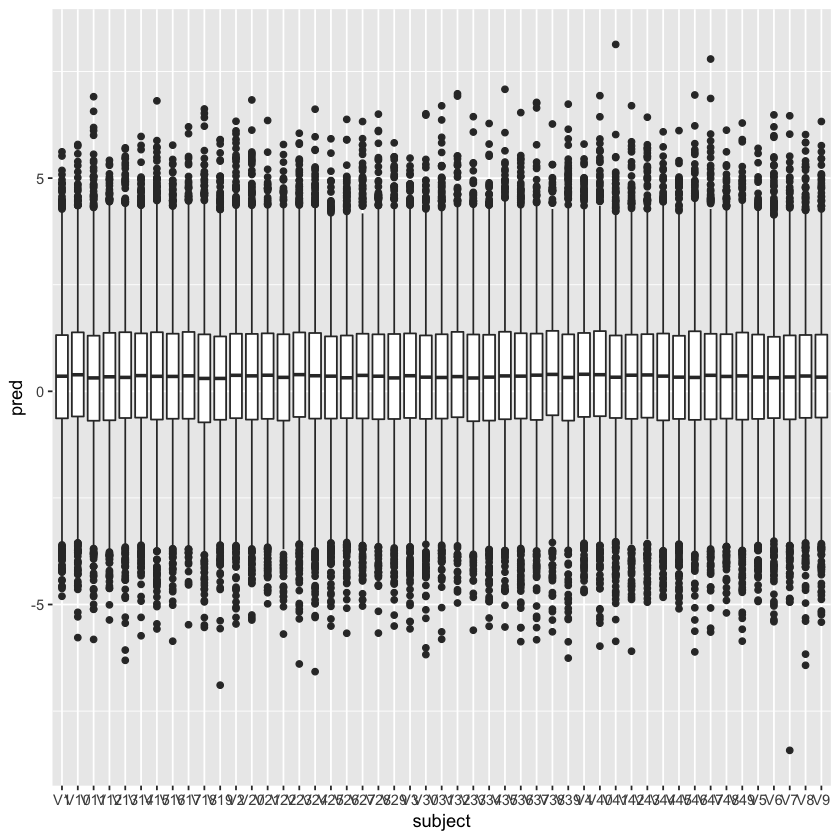

In [256]:
ppd_diff %>% as_tibble() %>%
    gather(subject, pred) %>%
    summarise(median = median(pred), mean = mean(pred), sd = sd(pred))
ppd_diff %>% as_tibble() %>%
    gather(subject, pred) %>%
    ggplot(aes(subject, pred)) +
    geom_boxplot()

In [236]:
# generate representative predictions
data_nocsection <- df %>% filter(csection == "0")
ppd_nocsection <- posterior_predict(fit, newdata = data_nocsection)
data_csection <- data_nocsection %>% mutate(csection = levels(csection)[2])
ppd_csection <- posterior_predict(fit, newdata = data_csection)
ppd_diff <- ppd_csection - ppd_nocsection
head(data_nocsection)
head(data_csection)

subject_id,age_d_s,time,cc,bf_count_s,sibling,birthweight_s,csection,PC1,PC2,⋯,UnculturedClostridialesI,UnculturedClostridialesII,UnculturedMollicutes,UnculturedSelenomonadaceae,Veillonella,Vibrio,Weissellaetrel,Wissellaetrel,Xanthomonadaceae,Yersiniaetrel
207,0.0320946,post,no,0.4394854,1,1.2879095,0,0.6522295,-5.032932881,⋯,1.519156,1.372621,0.7160732,-1.927865,0.007148415,-0.108562070,-0.6791592,-1.784952,-1.1159438,-0.5359848
381,0.5275689,post,yes,0.6456500,0,1.7973020,0,-3.8048090,-3.362396600,⋯,1.358990,1.214344,0.5915839,-2.070707,1.409812159,-0.589350080,-0.7658898,-2.065654,-1.1978351,-0.6346190
216,0.1311895,post,no,0.7889170,1,-1.5774233,0,0.5538182,-2.336839581,⋯,1.621011,1.462914,0.8533304,-1.818445,0.417198351,-0.390159598,-0.6681326,-1.779085,-0.9487532,-0.3955198
277,-0.9093066,pre,yes,0.4744286,1,-1.0468061,0,0.2194644,-3.135663325,⋯,1.615524,1.462349,0.8428852,-1.878539,-0.484742521,-0.071062489,-0.6091593,-1.718924,-0.6601443,-0.2722849
373,0.7753060,post,no,0.4394854,1,0.8421911,0,1.6423094,0.004709181,⋯,1.552632,1.429354,0.7843711,-1.855474,-0.475245113,-0.361699849,-0.5166646,-1.781343,-0.8140665,-0.3748597
245,-1.4543283,pre,no,0.7054417,0,0.3327986,0,-7.5754924,7.674966936,⋯,1.212791,1.253613,0.4562146,-2.194053,0.300599197,-0.005019015,-0.4691708,-2.100328,0.6002365,3.2915728


subject_id,age_d_s,time,cc,bf_count_s,sibling,birthweight_s,csection,PC1,PC2,⋯,UnculturedClostridialesI,UnculturedClostridialesII,UnculturedMollicutes,UnculturedSelenomonadaceae,Veillonella,Vibrio,Weissellaetrel,Wissellaetrel,Xanthomonadaceae,Yersiniaetrel
207,0.0320946,post,no,0.4394854,1,1.2879095,1,0.6522295,-5.032932881,⋯,1.519156,1.372621,0.7160732,-1.927865,0.007148415,-0.108562070,-0.6791592,-1.784952,-1.1159438,-0.5359848
381,0.5275689,post,yes,0.6456500,0,1.7973020,1,-3.8048090,-3.362396600,⋯,1.358990,1.214344,0.5915839,-2.070707,1.409812159,-0.589350080,-0.7658898,-2.065654,-1.1978351,-0.6346190
216,0.1311895,post,no,0.7889170,1,-1.5774233,1,0.5538182,-2.336839581,⋯,1.621011,1.462914,0.8533304,-1.818445,0.417198351,-0.390159598,-0.6681326,-1.779085,-0.9487532,-0.3955198
277,-0.9093066,pre,yes,0.4744286,1,-1.0468061,1,0.2194644,-3.135663325,⋯,1.615524,1.462349,0.8428852,-1.878539,-0.484742521,-0.071062489,-0.6091593,-1.718924,-0.6601443,-0.2722849
373,0.7753060,post,no,0.4394854,1,0.8421911,1,1.6423094,0.004709181,⋯,1.552632,1.429354,0.7843711,-1.855474,-0.475245113,-0.361699849,-0.5166646,-1.781343,-0.8140665,-0.3748597
245,-1.4543283,pre,no,0.7054417,0,0.3327986,1,-7.5754924,7.674966936,⋯,1.212791,1.253613,0.4562146,-2.194053,0.300599197,-0.005019015,-0.4691708,-2.100328,0.6002365,3.2915728


median,mean,sd
-0.6472347,-0.6473911,1.60616


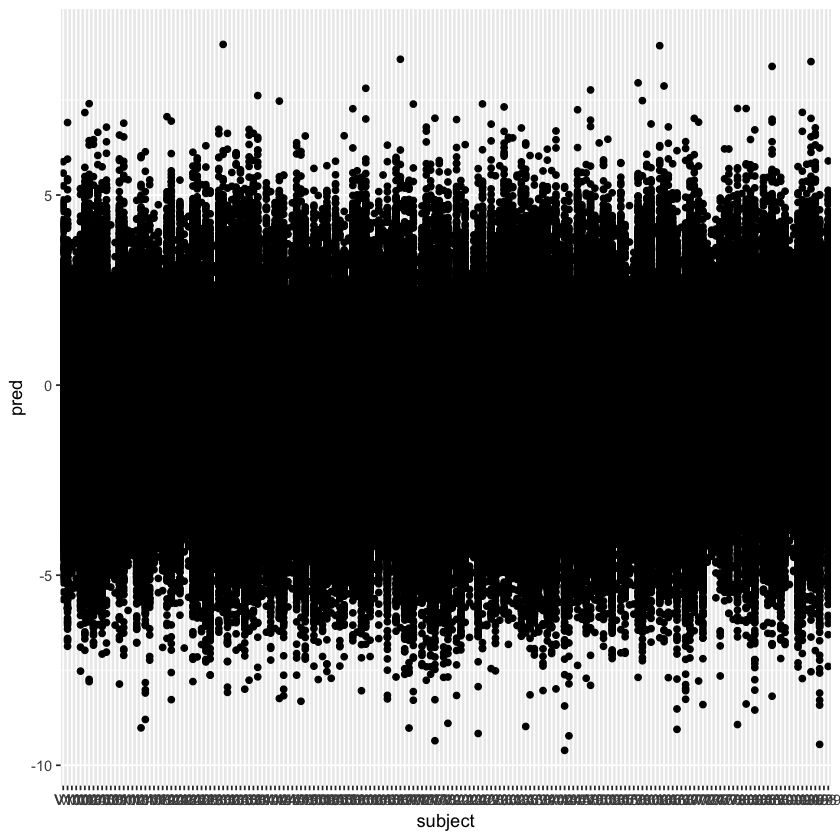

In [238]:
ppd_diff %>% as_tibble() %>%
    gather(subject, pred) %>%
    summarise(median = median(pred), mean = mean(pred), sd = sd(pred))
ppd_diff %>% as_tibble() %>%
    gather(subject, pred) %>%
    ggplot(aes(subject, pred)) +
    geom_point()

In [239]:
levels(df$csection)

[1] "0" "1"

In [244]:
# generate representative predictions
data_csection <- df %>% filter(csection == "1")
ppd_csection <- posterior_predict(fit, newdata = data_csection)
data_nocsection <- data_csection %>% mutate(csection = levels(csection)[1])
ppd_nocsection <- posterior_predict(fit, newdata = data_nocsection)
ppd_diff <- ppd_csection - ppd_nocsection
head(data_nocsection)
head(data_csection)

subject_id,age_d_s,time,cc,bf_count_s,sibling,birthweight_s,csection,PC1,PC2,⋯,UnculturedClostridialesI,UnculturedClostridialesII,UnculturedMollicutes,UnculturedSelenomonadaceae,Veillonella,Vibrio,Weissellaetrel,Wissellaetrel,Xanthomonadaceae,Yersiniaetrel
388,0.0320946,post,yes,-1.65710371,0,0.5238208,0,2.1772307,2.222413490,⋯,1.520612,1.402049,0.7529886,-1.886635,-0.4276279,-0.4805831,-0.6305419,-1.871706,-1.1035973,-0.4674334
283,0.4795079,post,yes,0.09005391,0,0.5238208,0,0.5556697,-1.347501503,⋯,1.610124,1.466770,0.8462103,-1.808476,-0.3150395,-0.4184502,-0.6420515,-1.821147,-0.9773721,-0.3960776
421,0.4780215,post,yes,0.09005391,1,-0.1023075,0,0.5243408,0.005801113,⋯,1.578274,1.445005,0.8132570,-1.837392,-0.1696010,-0.4168892,-0.6419023,-1.802403,-0.9928076,-0.3375375
292,1.0725906,pre,yes,-1.28154123,0,-1.1104802,0,2.4324891,1.712334263,⋯,1.607096,1.567049,0.8288716,-1.816765,-0.4178365,-0.3874585,-0.5899467,-1.744388,-0.9148393,-0.4111874
275,0.4780215,pre,yes,0.85244997,0,0.4813714,0,-0.9310922,6.181104827,⋯,1.440247,1.408680,0.7122106,-1.974555,3.0006419,-0.3691656,-0.3731716,-1.936300,-1.1407278,-0.1478228
421,-1.1074963,pre,yes,0.66661593,1,-0.1023075,0,1.0950596,0.371750499,⋯,1.566133,1.473774,0.7958727,-1.858768,-0.3231031,-0.4498122,-0.6630899,-1.860561,-1.0102419,-0.4245856


subject_id,age_d_s,time,cc,bf_count_s,sibling,birthweight_s,csection,PC1,PC2,⋯,UnculturedClostridialesI,UnculturedClostridialesII,UnculturedMollicutes,UnculturedSelenomonadaceae,Veillonella,Vibrio,Weissellaetrel,Wissellaetrel,Xanthomonadaceae,Yersiniaetrel
388,0.0320946,post,yes,-1.65710371,0,0.5238208,1,2.1772307,2.222413490,⋯,1.520612,1.402049,0.7529886,-1.886635,-0.4276279,-0.4805831,-0.6305419,-1.871706,-1.1035973,-0.4674334
283,0.4795079,post,yes,0.09005391,0,0.5238208,1,0.5556697,-1.347501503,⋯,1.610124,1.466770,0.8462103,-1.808476,-0.3150395,-0.4184502,-0.6420515,-1.821147,-0.9773721,-0.3960776
421,0.4780215,post,yes,0.09005391,1,-0.1023075,1,0.5243408,0.005801113,⋯,1.578274,1.445005,0.8132570,-1.837392,-0.1696010,-0.4168892,-0.6419023,-1.802403,-0.9928076,-0.3375375
292,1.0725906,pre,yes,-1.28154123,0,-1.1104802,1,2.4324891,1.712334263,⋯,1.607096,1.567049,0.8288716,-1.816765,-0.4178365,-0.3874585,-0.5899467,-1.744388,-0.9148393,-0.4111874
275,0.4780215,pre,yes,0.85244997,0,0.4813714,1,-0.9310922,6.181104827,⋯,1.440247,1.408680,0.7122106,-1.974555,3.0006419,-0.3691656,-0.3731716,-1.936300,-1.1407278,-0.1478228
421,-1.1074963,pre,yes,0.66661593,1,-0.1023075,1,1.0950596,0.371750499,⋯,1.566133,1.473774,0.7958727,-1.858768,-0.3231031,-0.4498122,-0.6630899,-1.860561,-1.0102419,-0.4245856


median,mean,sd
-0.775258,-0.7683956,1.583151


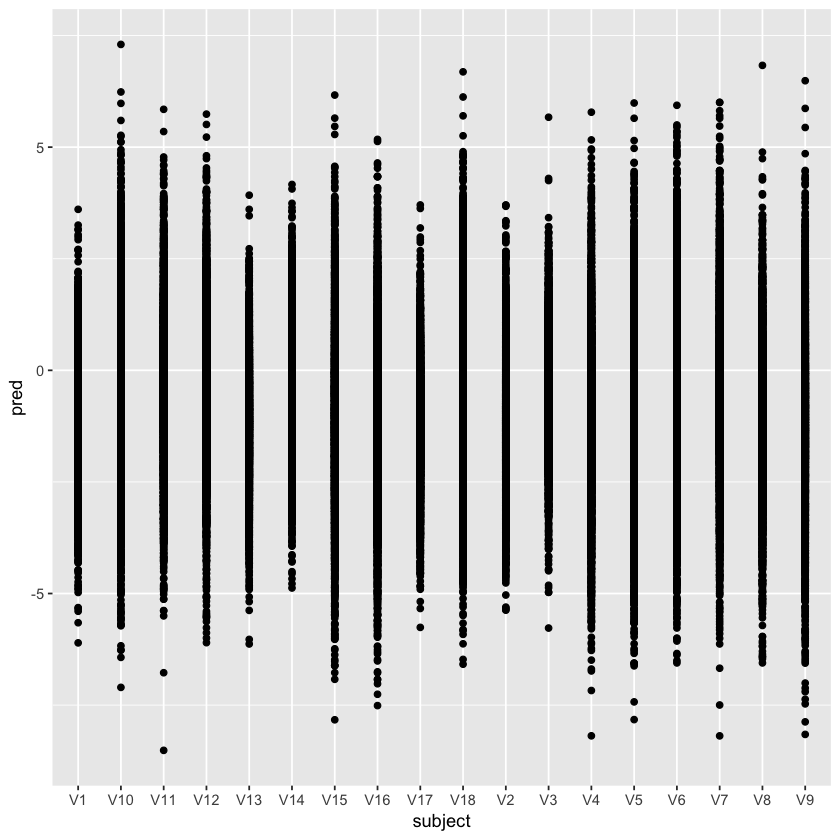

In [245]:
ppd_diff %>% as_tibble() %>%
    gather(subject, pred) %>%
    summarise(median = median(pred), mean = mean(pred), sd = sd(pred))
ppd_diff %>% as_tibble() %>%
    gather(subject, pred) %>%
    ggplot(aes(subject, pred)) +
    geom_point()

In [250]:
# generate representative predictions
data_sibling <- df %>% filter(sibling == "1")
ppd_sibling <- posterior_predict(fit3, newdata = data_sibling)
data_nosibling <- data_sibling %>% mutate(sibling = levels(df$sibling)[1])
ppd_nosibling <- posterior_predict(fit3, newdata = data_nosibling)
ppd_diff <- ppd_sibling - ppd_nosibling
head(data_sibling)
head(data_nosibling)

subject_id,age_d_s,time,cc,bf_count_s,sibling,birthweight_s,csection,PC1,PC2,⋯,UnculturedClostridialesI,UnculturedClostridialesII,UnculturedMollicutes,UnculturedSelenomonadaceae,Veillonella,Vibrio,Weissellaetrel,Wissellaetrel,Xanthomonadaceae,Yersiniaetrel
207,0.0320946,post,no,0.4394854,1,1.2879095,0,0.6522295,-5.032932881,⋯,1.519156,1.372621,0.7160732,-1.927865,0.007148415,-0.10856207,-0.6791592,-1.784952,-1.1159438,-0.5359848
216,0.1311895,post,no,0.7889170,1,-1.5774233,0,0.5538182,-2.336839581,⋯,1.621011,1.462914,0.8533304,-1.818445,0.417198351,-0.39015960,-0.6681326,-1.779085,-0.9487532,-0.3955198
277,-0.9093066,pre,yes,0.4744286,1,-1.0468061,0,0.2194644,-3.135663325,⋯,1.615524,1.462349,0.8428852,-1.878539,-0.484742521,-0.07106249,-0.6091593,-1.718924,-0.6601443,-0.2722849
373,0.7753060,post,no,0.4394854,1,0.8421911,0,1.6423094,0.004709181,⋯,1.552632,1.429354,0.7843711,-1.855474,-0.475245113,-0.36169985,-0.5166646,-1.781343,-0.8140665,-0.3748597
311,-1.1074963,pre,no,0.8588033,1,0.9270898,0,-3.3655968,1.922476013,⋯,1.473210,1.367651,0.7107343,-1.943173,-0.391414070,-0.41162254,-0.6586589,-1.908299,-0.9779423,0.5955757
213,-0.4633797,pre,yes,0.5996416,1,1.5001564,0,2.0631796,1.431106353,⋯,1.610503,1.618293,0.8436784,-1.829548,-0.401220212,-0.38813863,-0.4607259,-1.815414,-0.7706028,-0.3736356


subject_id,age_d_s,time,cc,bf_count_s,sibling,birthweight_s,csection,PC1,PC2,⋯,UnculturedClostridialesI,UnculturedClostridialesII,UnculturedMollicutes,UnculturedSelenomonadaceae,Veillonella,Vibrio,Weissellaetrel,Wissellaetrel,Xanthomonadaceae,Yersiniaetrel
207,0.0320946,post,no,0.4394854,0,1.2879095,0,0.6522295,-5.032932881,⋯,1.519156,1.372621,0.7160732,-1.927865,0.007148415,-0.10856207,-0.6791592,-1.784952,-1.1159438,-0.5359848
216,0.1311895,post,no,0.7889170,0,-1.5774233,0,0.5538182,-2.336839581,⋯,1.621011,1.462914,0.8533304,-1.818445,0.417198351,-0.39015960,-0.6681326,-1.779085,-0.9487532,-0.3955198
277,-0.9093066,pre,yes,0.4744286,0,-1.0468061,0,0.2194644,-3.135663325,⋯,1.615524,1.462349,0.8428852,-1.878539,-0.484742521,-0.07106249,-0.6091593,-1.718924,-0.6601443,-0.2722849
373,0.7753060,post,no,0.4394854,0,0.8421911,0,1.6423094,0.004709181,⋯,1.552632,1.429354,0.7843711,-1.855474,-0.475245113,-0.36169985,-0.5166646,-1.781343,-0.8140665,-0.3748597
311,-1.1074963,pre,no,0.8588033,0,0.9270898,0,-3.3655968,1.922476013,⋯,1.473210,1.367651,0.7107343,-1.943173,-0.391414070,-0.41162254,-0.6586589,-1.908299,-0.9779423,0.5955757
213,-0.4633797,pre,yes,0.5996416,0,1.5001564,0,2.0631796,1.431106353,⋯,1.610503,1.618293,0.8436784,-1.829548,-0.401220212,-0.38813863,-0.4607259,-1.815414,-0.7706028,-0.3736356


median,mean,sd
0.4849807,0.484977,1.302744


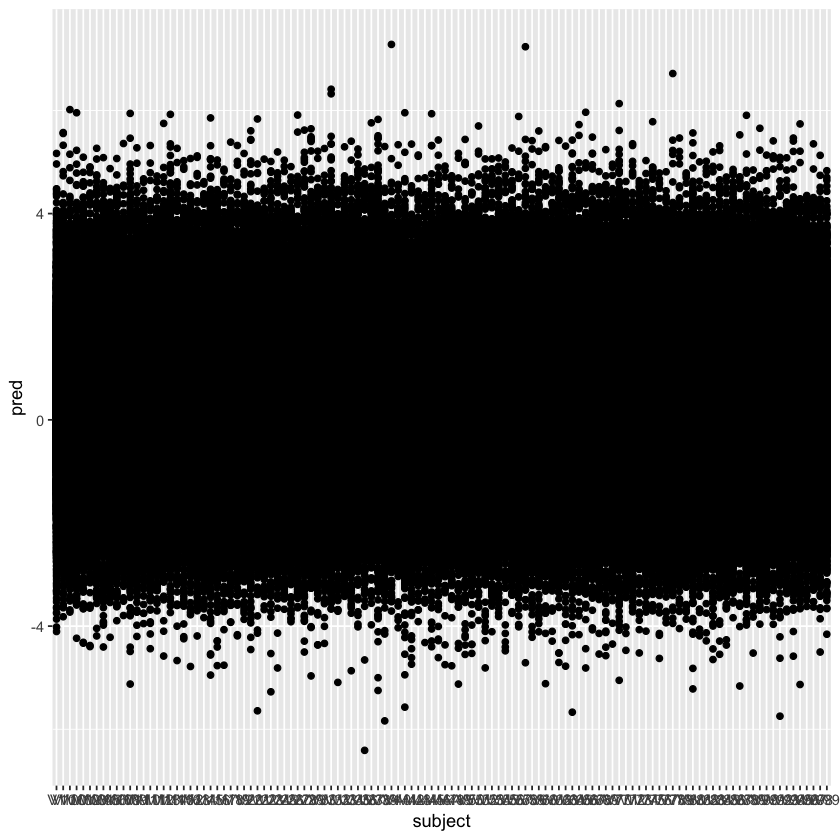

In [251]:
ppd_diff %>% as_tibble() %>%
    gather(subject, pred) %>%
    summarise(median = median(pred), mean = mean(pred), sd = sd(pred))
ppd_diff %>% as_tibble() %>%
    gather(subject, pred) %>%
    ggplot(aes(subject, pred)) +
    geom_point()

In [249]:
summary(fit3)

 Family: gaussian 
  Links: mu = identity; sigma = identity 
Formula: Bifidobacterium ~ time * cc + age_d_s + bf_count_s + sibling * csection + (1 | subject_id) 
   Data: data_imp[[1]] (Number of observations: 196) 
Samples: 4 chains, each with iter = 2000; warmup = 1000; thin = 1;
         total post-warmup samples = 4000

Group-Level Effects: 
~subject_id (Number of levels: 98) 
              Estimate Est.Error l-95% CI u-95% CI Eff.Sample Rhat
sd(Intercept)     0.98      0.11     0.78     1.21       1231 1.00

Population-Level Effects: 
                   Estimate Est.Error l-95% CI u-95% CI Eff.Sample Rhat
Intercept              5.68      0.29     5.10     6.24       2303 1.00
timepost               0.14      0.34    -0.51     0.82       2415 1.00
ccyes                  0.07      0.27    -0.46     0.60       2559 1.00
age_d_s               -0.15      0.19    -0.54     0.22       2324 1.00
bf_count_s             0.05      0.11    -0.16     0.26       3394 1.00
sibling1              

In [8]:
models <- map(genera, function(genus) {
    # define the formula 
    formula_mu <- glue("{genus} ~ time*cc + age_d_s + bf_count_s + sibling*csection +
                    (1 + time + age_d_s + bf_count_s)") %>% as.formula()
    formula_sigma <- sigma ~ 1 + time*cc + age_d_s + bf_count_s + sibling * csection
    # fit model
    fit <- brm_multiple(
        data = data_imp,
        family = skew_normal(),
        formula = bf(formula_mu, formula_sigma),
        prior = prior(normal(0, 1), class = b),
        file = here(glue("models/test_{genus}_prior")),
        control = list(adapt_delta = 0.95, max_treedepth = 15)
    )
})

subject_id,age_d_s,time,cc,bf_count_s,sibling,birthweight_s,csection,PC1,PC2,⋯,UnculturedClostridialesI,UnculturedClostridialesII,UnculturedMollicutes,UnculturedSelenomonadaceae,Veillonella,Vibrio,Weissellaetrel,Wissellaetrel,Xanthomonadaceae,Yersiniaetrel
207,0.0320946,post,no,0.43948544,1,1.28790953,0,0.6522295,-5.032932881,⋯,1.519156,1.3726209,0.7160732,-1.927865,0.007148415,-0.108562070,-0.67915916,-1.784952,-1.1159438,-0.5359848
388,0.0320946,post,yes,-1.65710371,0,0.52382077,1,2.1772307,2.222413490,⋯,1.520612,1.4020486,0.7529886,-1.886635,-0.427627883,-0.480583067,-0.63054186,-1.871706,-1.1035973,-0.4674334
381,0.5275689,post,yes,0.64565004,0,1.79730203,0,-3.8048090,-3.362396600,⋯,1.358990,1.2143443,0.5915839,-2.070707,1.409812159,-0.589350080,-0.76588975,-2.065654,-1.1978351,-0.6346190
283,0.4795079,post,yes,0.09005391,0,0.52382077,1,0.5556697,-1.347501503,⋯,1.610124,1.4667699,0.8462103,-1.808476,-0.315039540,-0.418450181,-0.64205152,-1.821147,-0.9773721,-0.3960776
216,0.1311895,post,no,0.78891696,1,-1.57742330,0,0.5538182,-2.336839581,⋯,1.621011,1.4629138,0.8533304,-1.818445,0.417198351,-0.390159598,-0.66813261,-1.779085,-0.9487532,-0.3955198
277,-0.9093066,pre,yes,0.47442859,1,-1.04680611,0,0.2194644,-3.135663325,⋯,1.615524,1.4623489,0.8428852,-1.878539,-0.484742521,-0.071062489,-0.60915929,-1.718924,-0.6601443,-0.2722849
373,0.7753060,post,no,0.43948544,1,0.84219109,0,1.6423094,0.004709181,⋯,1.552632,1.4293541,0.7843711,-1.855474,-0.475245113,-0.361699849,-0.51666458,-1.781343,-0.8140665,-0.3748597
245,-1.4543283,pre,no,0.70544165,0,0.33279859,0,-7.5754924,7.674966936,⋯,1.212791,1.2536134,0.4562146,-2.194053,0.300599197,-0.005019015,-0.46917080,-2.100328,0.6002365,3.2915728
311,-1.1074963,pre,no,0.85880327,1,0.92708984,0,-3.3655968,1.922476013,⋯,1.473210,1.3676510,0.7107343,-1.943173,-0.391414070,-0.411622545,-0.65865893,-1.908299,-0.9779423,0.5955757
213,-0.4633797,pre,yes,0.59964155,1,1.50015640,0,2.0631796,1.431106353,⋯,1.610503,1.6182928,0.8436784,-1.829548,-0.401220212,-0.388138631,-0.46072588,-1.815414,-0.7706028,-0.3736356


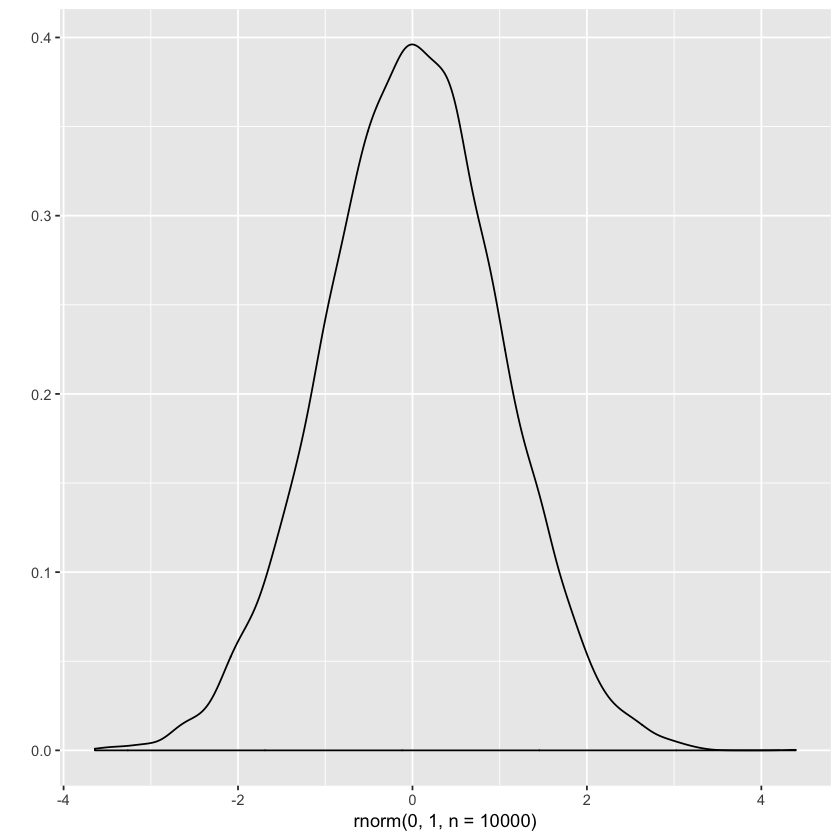

In [24]:
qplot(rnorm(0, 1, n = 1e4), geom = "density")

In [ ]:
post <- map2(models, test_genus, function(fit, genus) {
   # calculate posterior means of interest
    posterior_samples(fit) %>%
        mutate(
            # homepre
            home_pre_nosib_nocsec = b_Intercept * 16/49,
            home_pre_nosib_csec = (b_Intercept + b_csection1) * 1/49,
            home_pre_sib_nocsec = (b_Intercept + b_sibling1) * 30/49,
            home_pre_sib_csec = (b_Intercept + b_sibling1 + b_csection1 + `b_sibling1:csection1`) * 2/49,
            homepre = home_pre_nosib_nocsec + home_pre_nosib_csec + home_pre_sib_nocsec + home_pre_sib_csec,

            # homepost
            home_post_nosib_nocsec = (b_Intercept + b_timepost) * 16/49,
            home_post_nosib_csec = (b_Intercept + b_timepost + b_csection1) * 1/49,
            home_post_sib_nocsec = (b_Intercept + b_timepost + b_sibling1) * 30/49,
            home_post_sib_csec = (b_Intercept + b_timepost + b_sibling1 + b_csection1 + `b_sibling1:csection1`) * 2/49,
            homepost = home_post_nosib_nocsec + home_post_nosib_csec + home_post_sib_nocsec + home_post_sib_csec,

            # ccpre
            cc_pre_nosib_nocsec = (b_Intercept + b_ccyes) * 19/49,
            cc_pre_nosib_csec = (b_Intercept + b_ccyes + b_csection1) * 4/49,
            cc_pre_sib_nocsec = (b_Intercept + b_ccyes + b_sibling1) * 24/49,
            cc_pre_sib_csec = (b_Intercept + b_ccyes + b_sibling1 + b_csection1 + `b_sibling1:csection1`) * 2/49,
            ccpre = cc_pre_nosib_nocsec + cc_pre_nosib_csec + cc_pre_sib_nocsec + cc_pre_sib_csec,

            # ccpost
            cc_post_nosib_nocsec = (b_Intercept + b_ccyes + b_timepost) * 19/49,
            cc_post_nosib_csec = (b_Intercept + b_ccyes + b_timepost + b_csection1) * 4/49,
            cc_post_sib_nocsec = (b_Intercept + b_ccyes + b_timepost + b_sibling1) * 24/49,
            cc_post_sib_csec = (b_Intercept + b_ccyes + b_timepost + b_sibling1 + b_csection1 + `b_sibling1:csection1`) * 2/49,
            ccpost = cc_post_nosib_nocsec + cc_post_nosib_csec + cc_post_sib_nocsec + cc_post_sib_csec,
            
            # csection 
            csec_home_pre_nosib = (b_Intercept + b_csection1) * 1/18,
            csec_home_pre_sib = (b_Intercept + b_sibling1 + b_csection1 + `b_sibling1:csection1`) * 2/18,
            csec_home_post_nosib = (b_Intercept + b_timepost + b_csection1) * 1/18,
            csec_home_post_sib = (b_Intercept + b_timepost + b_sibling1 + b_csection1 + `b_sibling1:csection1`) * 2/18,
            csec_cc_pre_nosib = (b_Intercept + b_ccyes + b_csection1) * 4/18,
            csec_cc_pre_sib = (b_Intercept + b_ccyes + b_sibling1 + b_csection1 + `b_sibling1:csection1`) * 2/18,
            csec_cc_post_nosib = (b_Intercept + b_ccyes + b_timepost + b_csection1) * 4/18,
            csec_cc_post_sib = (b_Intercept + b_ccyes + b_timepost + b_sibling1 + b_csection1 + `b_sibling1:csection1`) * 2/18,

            # no csection 
            nocsec_home_pre_nosib = (b_Intercept) * 16/178,
            nocsec_home_pre_sib = (b_Intercept + b_sibling1) * 30/178,
            nocsec_home_post_nosib = (b_Intercept + b_timepost) * 16/178,
            nocsec_home_post_sib = (b_Intercept + b_timepost + b_sibling1) * 30/178,
            nocsec_cc_pre_nosib = (b_Intercept + b_ccyes) * 19/178,
            nocsec_cc_pre_sib = (b_Intercept + b_ccyes + b_sibling1) * 24/178,
            nocsec_cc_post_nosib = (b_Intercept + b_ccyes + b_timepost) * 19/178,
            nocsec_cc_post_sib = (b_Intercept + b_ccyes + b_timepost + b_sibling1) * 24/178,
            
            nocsec = (nocsec_home_pre_nosib + nocsec_home_pre_sib + nocsec_home_post_nosib + nocsec_home_post_sib +
                      nocsec_cc_pre_nosib + nocsec_cc_pre_sib + nocsec_cc_post_nosib + nocsec_cc_post_sib),
            
            csec = (nocsec_home_pre_nosib + nocsec_home_pre_sib + nocsec_home_post_nosib + nocsec_home_post_sib +
                      nocsec_cc_pre_nosib + nocsec_cc_pre_sib + nocsec_cc_post_nosib + csec_cc_post_sib), 


            # mu diff
            ccpre_homepre = ccpre - homepre,
            ccpost_homepost = ccpost - homepost,
            ccpost_ccpre = ccpost - ccpre,
            homepost_homepre = homepost - homepre,
            csec_nocsec = csec - nocsec,
            
            
            # store genus
            genus = genus

        ) %>%
    select(genus, ccpre_homepre, ccpost_homepost, ccpost_ccpre, homepost_homepre, csec_nocsec, nocsec, csec)
})

post <- map_dfr(post, bind_rows)